In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.optimize import minimize
import pandas as pd

In [2]:
df = pd.read_csv("data/AirQualityUCI.csv", sep=';', decimal=',', engine='python')

# Удаление лишних последних колонок
df = df.iloc[:, :-2]

In [3]:
df['Time_dt'] = pd.to_datetime(df['Time'], format='%H.%M.%S')

def time_of_day(hour, minute):
    total_minutes = hour * 60 + minute
    if 0 <= total_minutes < 6*60:
        return 0
    elif 6*60 <= total_minutes < 12*60:
        return 1
    elif 12*60 <= total_minutes < 18*60:
        return 2    
    else:
        return 3

df['TimeOfDay'] = df['Time_dt'].apply(lambda x: time_of_day(x.hour, x.minute))

df.drop(columns=['Time_dt'], inplace=True)

print(df[['Time', 'TimeOfDay']].head(10))

       Time  TimeOfDay
0  18.00.00          3
1  19.00.00          3
2  20.00.00          3
3  21.00.00          3
4  22.00.00          3
5  23.00.00          3
6  00.00.00          0
7  01.00.00          0
8  02.00.00          0
9  03.00.00          0


In [4]:

df.drop(columns=['Date', 'Time'], inplace=True)

df.replace(-200, pd.NA, inplace=True)

df = df.apply(pd.to_numeric, errors='coerce')

description = df.describe()

print(description)


            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  7674.000000  8991.000000   914.000000  8991.000000    8991.000000   
mean      2.152750  1099.833166   218.811816    10.083105     939.153376   
std       1.453252   217.080037   204.459921     7.449820     266.831429   
min       0.100000   647.000000     7.000000     0.100000     383.000000   
25%       1.100000   937.000000    67.000000     4.400000     734.500000   
50%       1.800000  1063.000000   150.000000     8.200000     909.000000   
75%       2.900000  1231.000000   297.000000    14.000000    1116.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  7718.000000   8991.000000  7715.000000   8991.000000  8991.000000   
mean    246.896735    835.493605   113.091251   1456.264598  1022.906128   
std     212.979168    256.817320    48.370108    346.206794   398.484288   
min       2

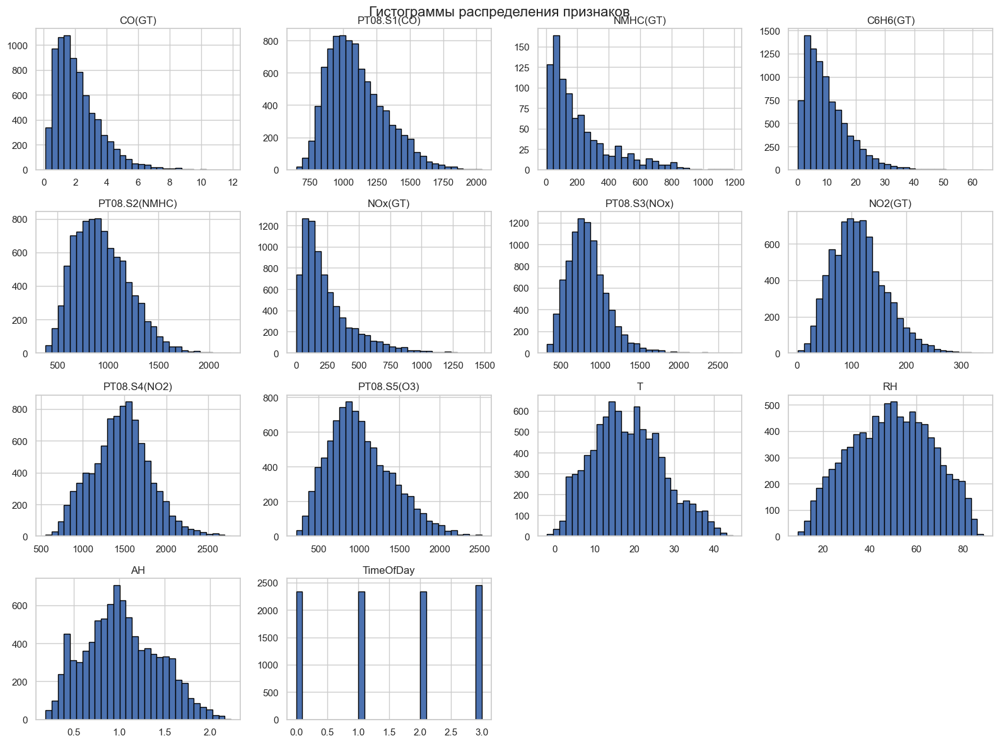

In [5]:
sns.set(style="whitegrid")

# Построение гистограмм для всех признаков
df.hist(bins=30, figsize=(16, 12), edgecolor='black')
plt.suptitle("Гистограммы распределения признаков", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()


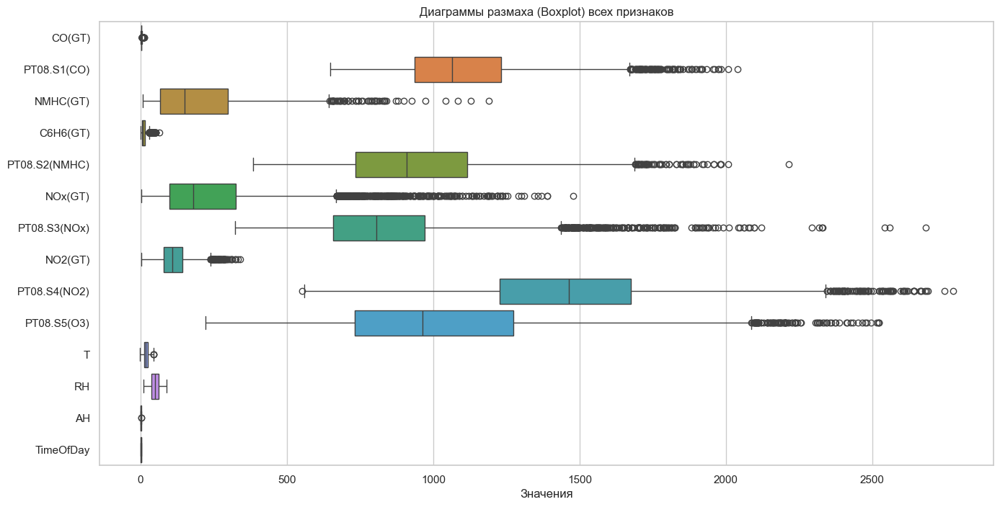

In [6]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, orient='h')
plt.title("Диаграммы размаха (Boxplot) всех признаков")
plt.xlabel("Значения")
plt.show()


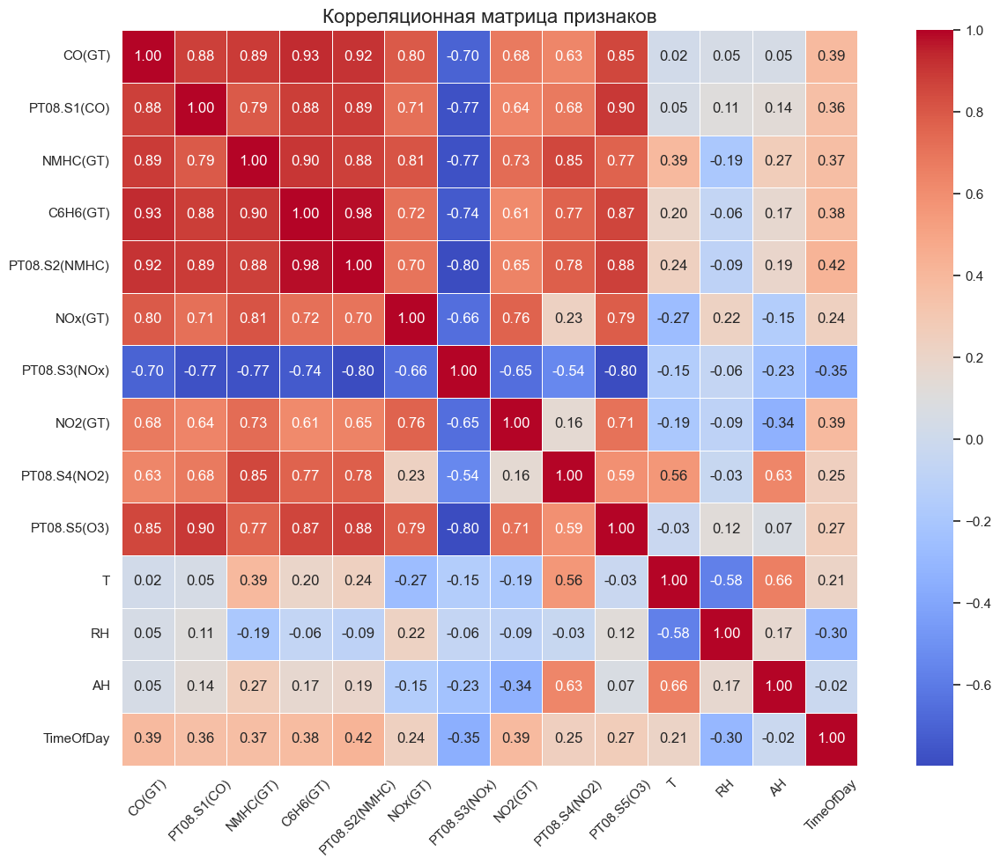

In [7]:
# Вычисление корреляционной матрицы (по Пирсону)
corr_matrix = df.corr(method='pearson')

# Построение тепловой карты
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5, square=True)
plt.title("Корреляционная матрица признаков", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

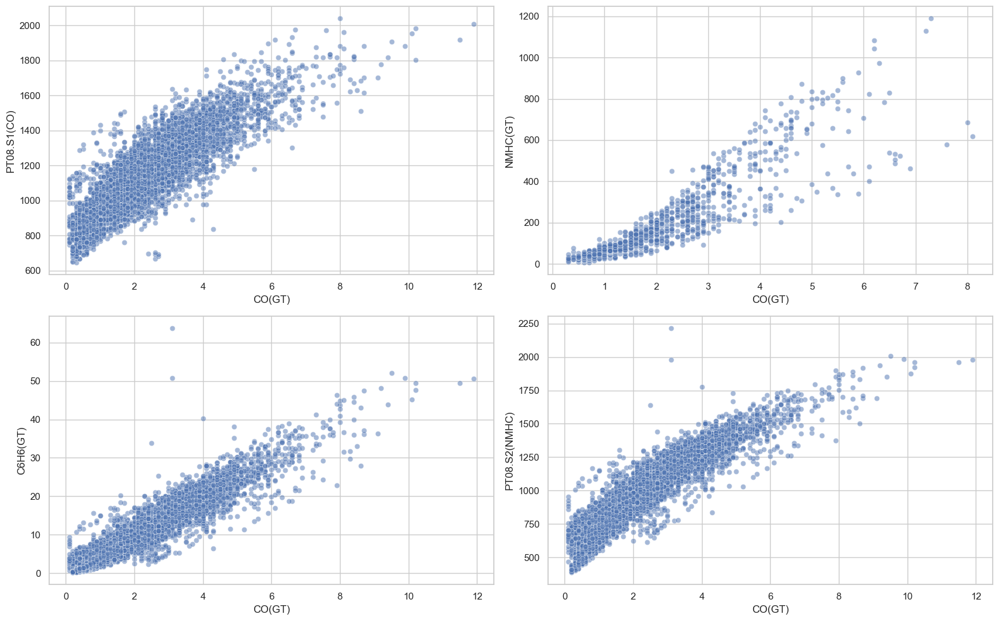

In [8]:
# Список признаков для сравнения с CO(GT)
features_to_compare = ['PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)']

plt.figure(figsize=(16, 10))
for i, feature in enumerate(features_to_compare):
    plt.subplot(2, 2, i + 1)
    sns.scatterplot(data=df, x='CO(GT)', y=feature, alpha=0.5)
    plt.xlabel('CO(GT)')
    plt.ylabel(feature)
plt.tight_layout()
plt.show()


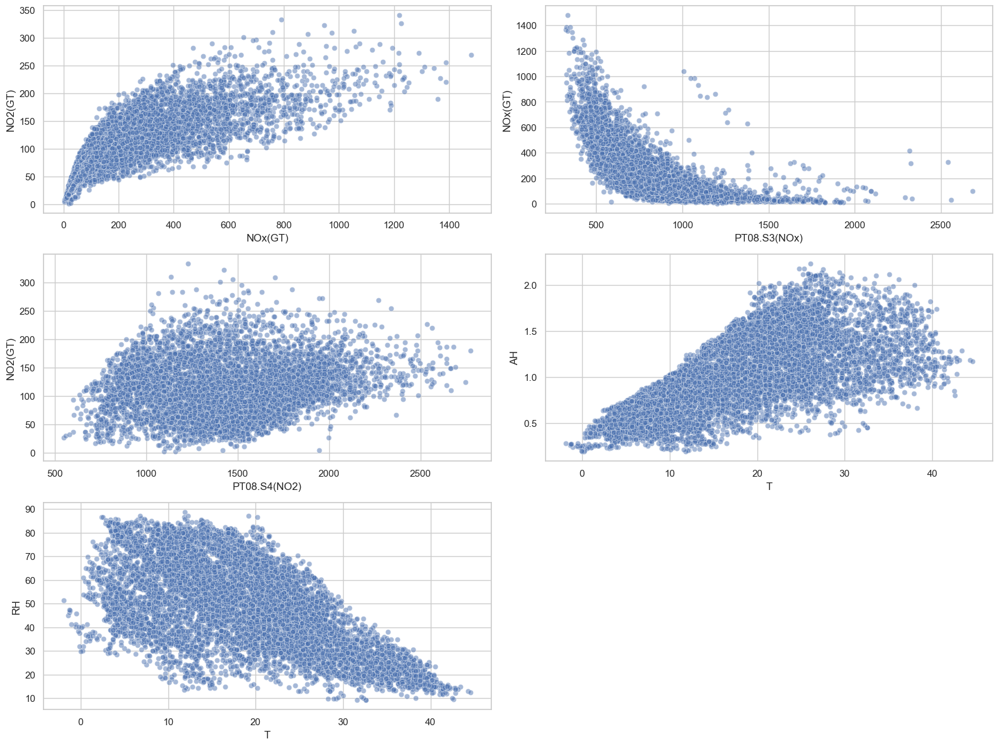

In [9]:
# Пары признаков для визуализации
scatter_pairs = [
    ('NOx(GT)', 'NO2(GT)'),
    ('PT08.S3(NOx)', 'NOx(GT)'),
    ('PT08.S4(NO2)', 'NO2(GT)'),
    ('T', 'AH'),
    ('T', 'RH')
]

# Построение диаграмм рассеяния
plt.figure(figsize=(16, 12))
for i, (x_feat, y_feat) in enumerate(scatter_pairs):
    plt.subplot(3, 2, i + 1)
    sns.scatterplot(data=df, x=x_feat, y=y_feat, alpha=0.5)
    plt.xlabel(x_feat)
    plt.ylabel(y_feat)
plt.tight_layout()
plt.show()

In [10]:
print(f"Размерность до удаления дубликатов: {df.shape}")
num_duplicates = df.duplicated(keep='first').sum()
print(f"Найдено дубликатов: {num_duplicates}")

df = df.drop_duplicates()

print(f"Размерность после удаления дубликатов: {df.shape}")

Размерность до удаления дубликатов: (9471, 14)
Найдено дубликатов: 142
Размерность после удаления дубликатов: (9329, 14)


In [11]:
# Размерность до
print("Размерность до удаления выбросов:", df.shape)

# Вычислим границы квантилей для каждого признака
lower_quantiles = df.quantile(0.005)
upper_quantiles = df.quantile(0.995)

# Оставим строки, где ВСЕ признаки лежат внутри [Q0.1, Q0.99]
mask = ~((df < lower_quantiles) | (df > upper_quantiles)).any(axis=1)
df = df[mask]

# Размерность после
print("Размерность после удаления выбросов:", df.shape)

Размерность до удаления выбросов: (9329, 14)
Размерность после удаления выбросов: (8740, 14)


In [12]:
# Подсчёт пропусков
print("Количество пропущенных значений до заполнения:")
print(df.isna().sum())

# Заполнение медианами
df = df.fillna(df.median(numeric_only=True))

# Проверим результат
print("\nКоличество пропущенных значений после заполнения:")
print(df.isna().sum())

Количество пропущенных значений до заполнения:
CO(GT)           1575
PT08.S1(CO)       318
NMHC(GT)         7860
C6H6(GT)          318
PT08.S2(NMHC)     318
NOx(GT)          1550
PT08.S3(NOx)      318
NO2(GT)          1553
PT08.S4(NO2)      318
PT08.S5(O3)       318
T                 318
RH                318
AH                318
TimeOfDay           0
dtype: int64

Количество пропущенных значений после заполнения:
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
TimeOfDay        0
dtype: int64


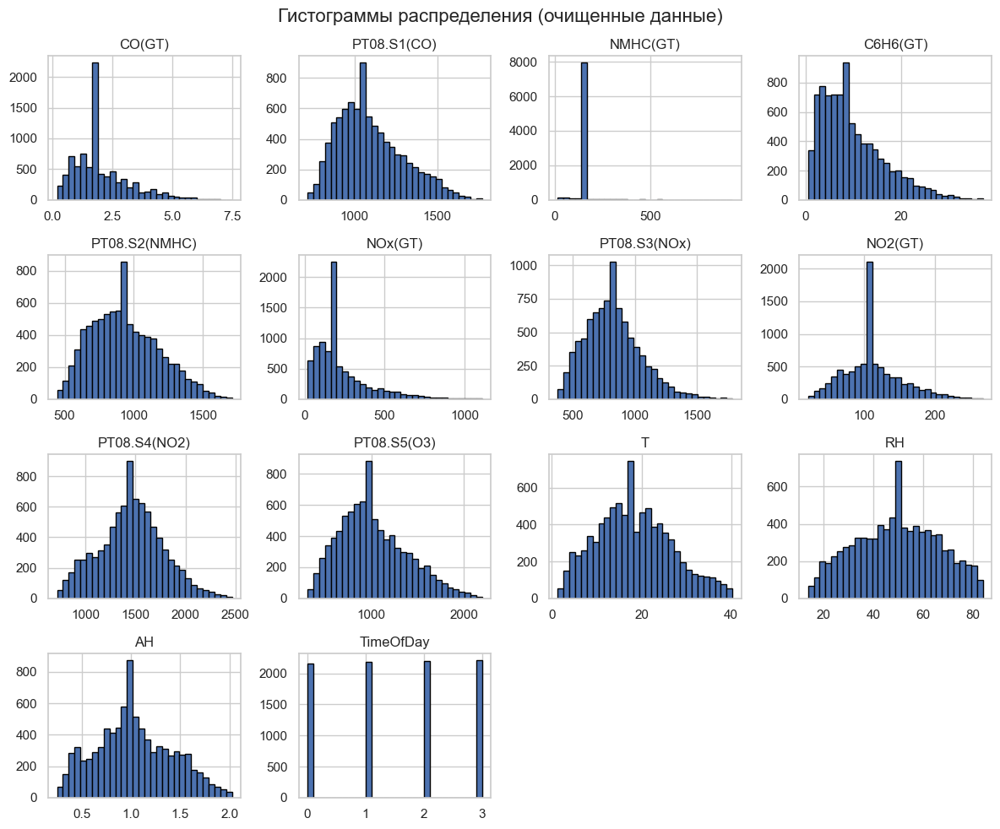

In [13]:
# --- 1. Гистограммы ---
df.hist(bins=30, figsize=(12, 10), edgecolor='black')
plt.suptitle('Гистограммы распределения (очищенные данные)', fontsize=16)
plt.tight_layout()
plt.show()

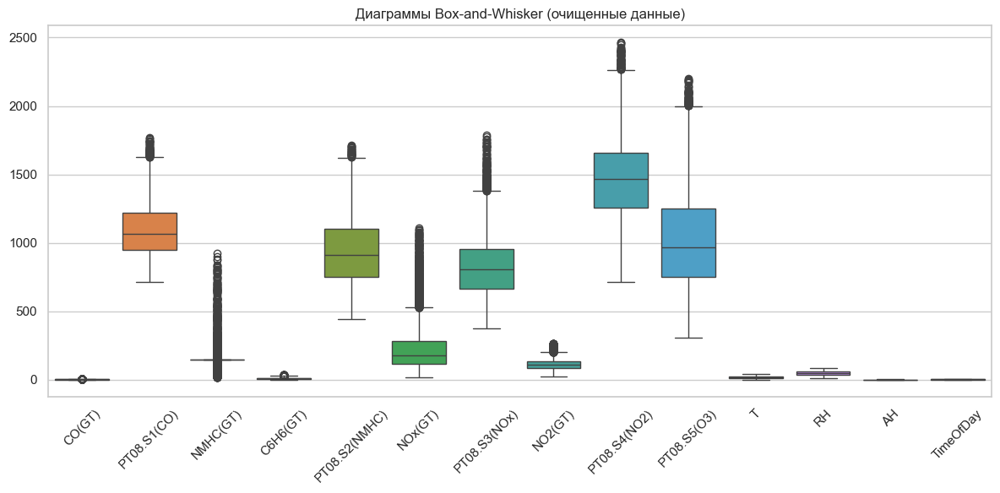

In [14]:
# --- 2. Box-and-Whisker ---
plt.figure(figsize=(12, 6))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.title('Диаграммы Box-and-Whisker (очищенные данные)')
plt.tight_layout()
plt.show()

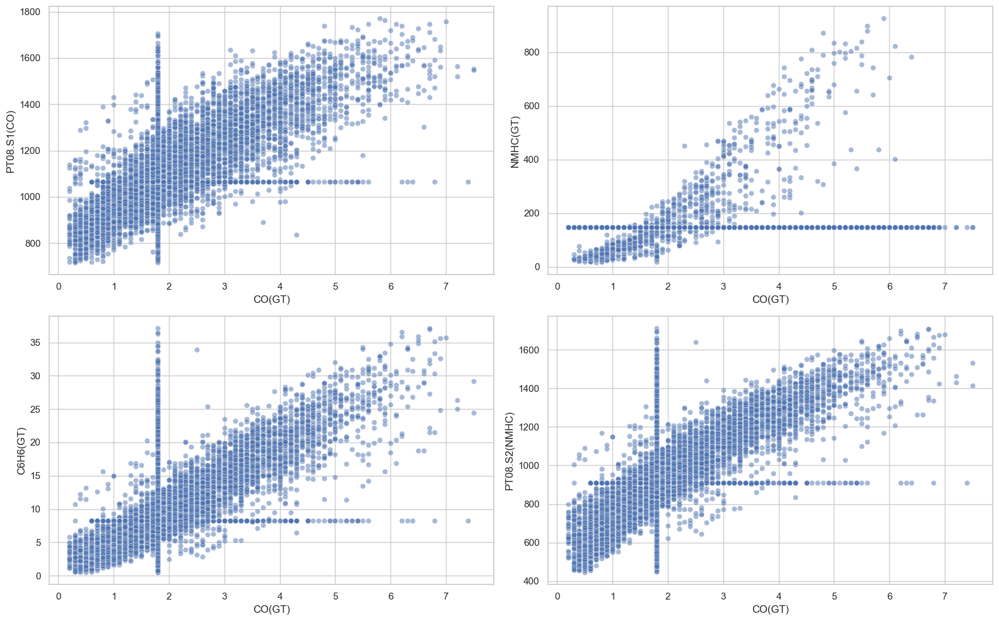

In [15]:
# Список признаков для сравнения с CO(GT)
features_to_compare = ['PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)']

# Построим диаграммы рассеяния
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features_to_compare):
    plt.subplot(2, 2, i + 1)
    sns.scatterplot(data=df, x='CO(GT)', y=feature, alpha=0.5)
    plt.xlabel('CO(GT)')
    plt.ylabel(feature)
plt.tight_layout()
plt.show()


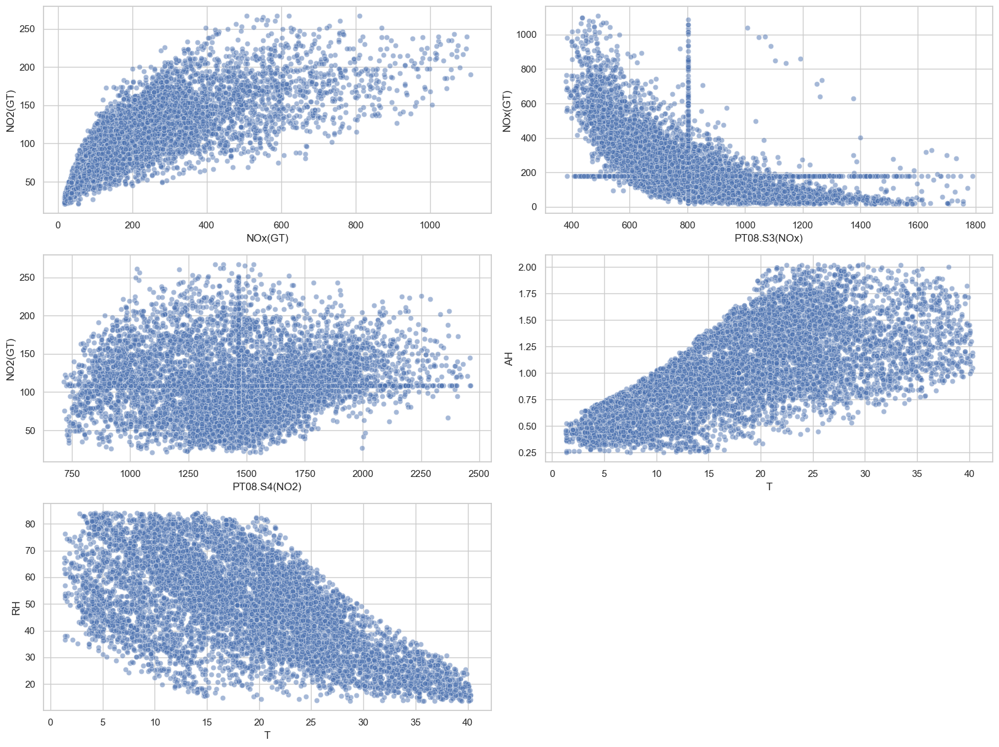

In [16]:
# Пары признаков для визуализации
scatter_pairs = [
    ('NOx(GT)', 'NO2(GT)'),
    ('PT08.S3(NOx)', 'NOx(GT)'),
    ('PT08.S4(NO2)', 'NO2(GT)'),
    ('T', 'AH'),
    ('T', 'RH')
]

# Построение диаграмм рассеяния
plt.figure(figsize=(16, 12))
for i, (x_feat, y_feat) in enumerate(scatter_pairs):
    plt.subplot(3, 2, i + 1)
    sns.scatterplot(data=df, x=x_feat, y=y_feat, alpha=0.5)
    plt.xlabel(x_feat)
    plt.ylabel(y_feat)
plt.tight_layout()
plt.show()

In [17]:
# Разделим входные и выходные данные
X = df.drop(columns='NO2(GT)')
y = df['NO2(GT)']

In [18]:
X_temp, X_train, y_temp, y_train = train_test_split(X, y, test_size=0.60, random_state=42)

X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.75, random_state=42)

print(f'Train: {len(X_train)}, Validation: {len(X_val)}, Test: {len(X_test)}')

Train: 5244, Validation: 2622, Test: 874


In [19]:
# Масштабирование признаков
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_val_scaled = scaler_X.fit_transform(X_val)
X_test_scaled = scaler_X.transform(X_test)

In [20]:
# Масштабирование выходов
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1))
y_val_scaled = scaler_y.fit_transform(y_val.values.reshape(-1, 1))
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1))

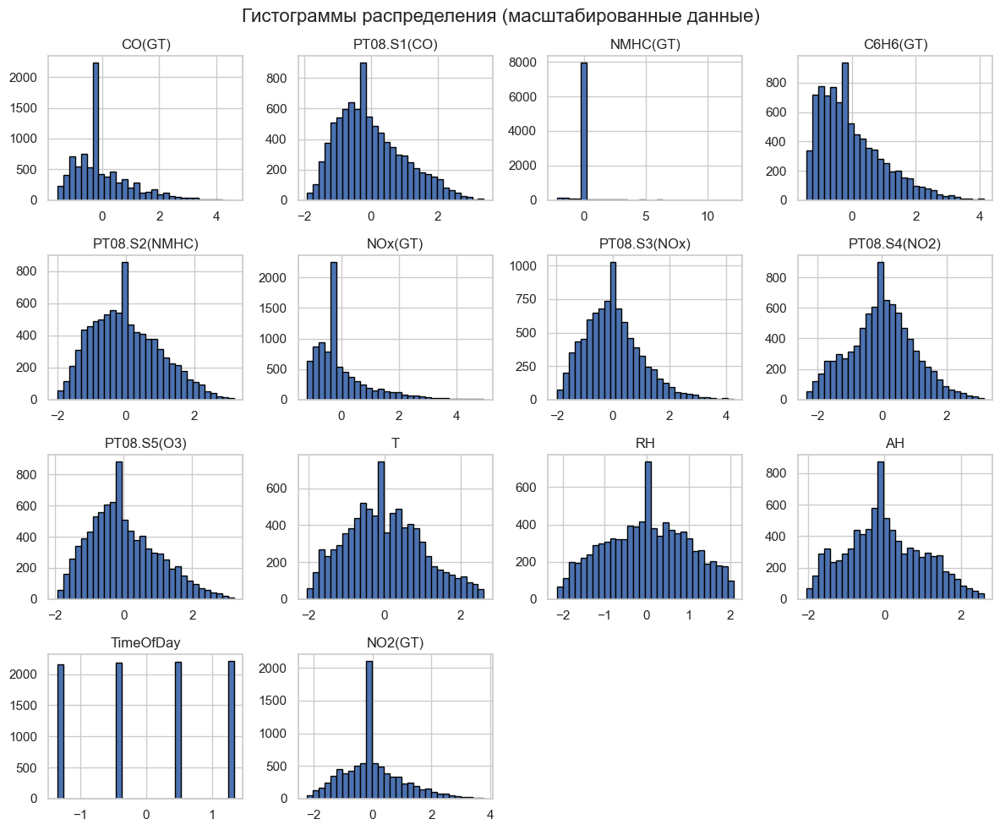

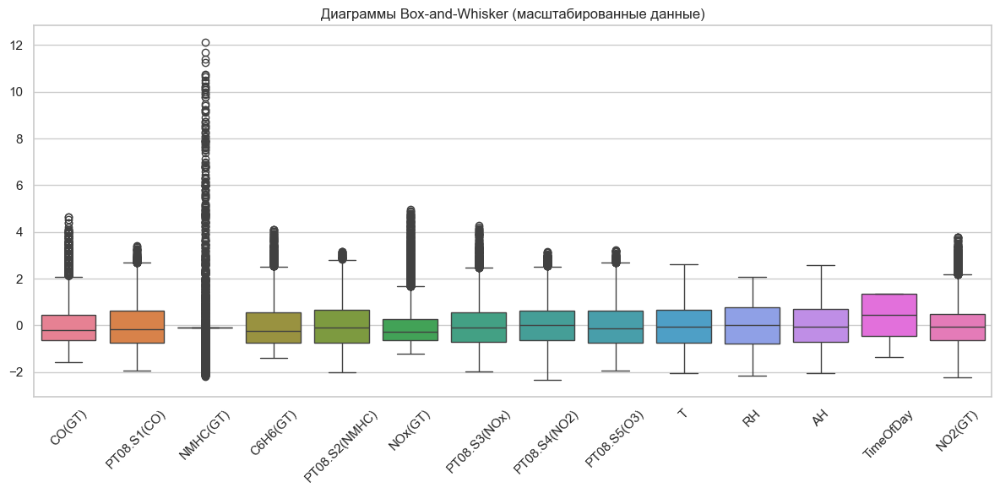

In [21]:
# 5. Масштабированный DataFrame (для графиков)
df = pd.DataFrame(scaler_X.fit_transform(X), columns=X.columns)
df['NO2(GT)'] = scaler_y.fit_transform(y.values.reshape(-1, 1))


# --- 6. Гистограммы ---
df.hist(bins=30, figsize=(12, 10), edgecolor='black')
plt.suptitle('Гистограммы распределения (масштабированные данные)', fontsize=16)
plt.tight_layout()
plt.show()

# --- 7. Box-and-Whisker ---
plt.figure(figsize=(12, 6))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.title('Диаграммы Box-and-Whisker (масштабированные данные)')
plt.tight_layout()
plt.show()

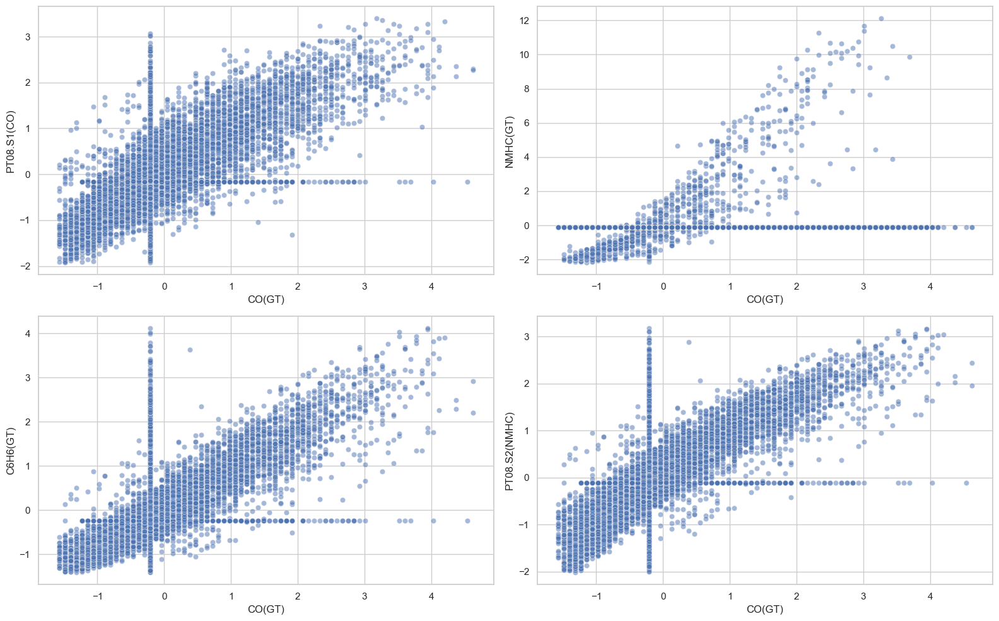

In [22]:
# Список признаков для сравнения с CO(GT)
features_to_compare = ['PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)']

# Построим диаграммы рассеяния
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features_to_compare):
    plt.subplot(2, 2, i + 1)
    sns.scatterplot(data=df, x='CO(GT)', y=feature, alpha=0.5)
    plt.xlabel('CO(GT)')
    plt.ylabel(feature)
plt.tight_layout()
plt.show()

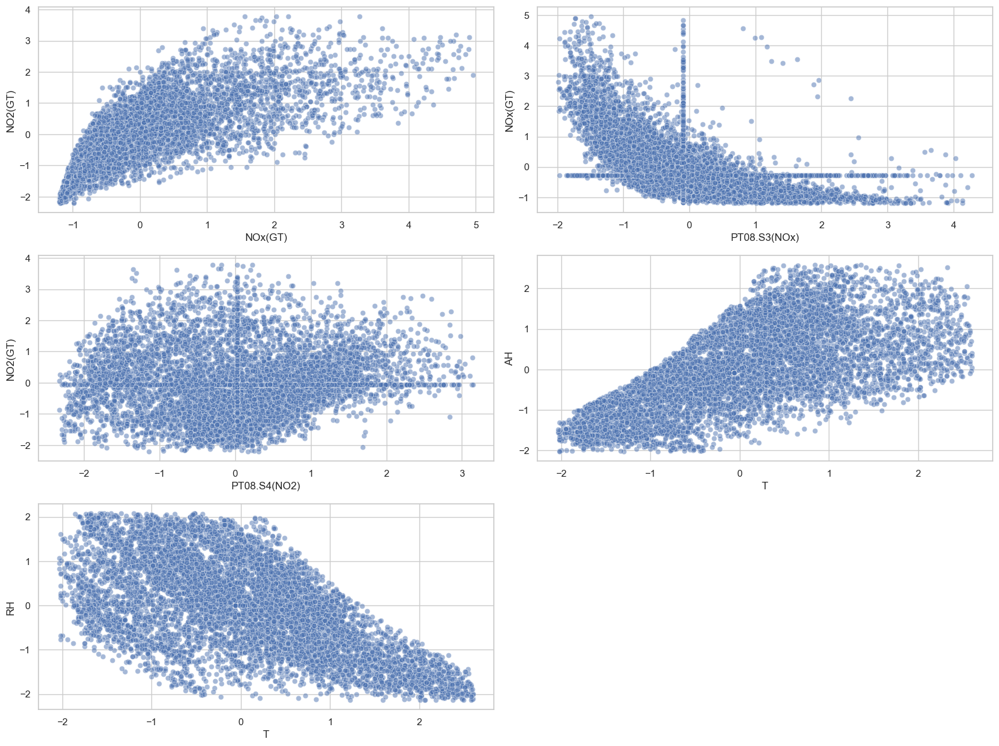

In [23]:
# Пары признаков для визуализации
scatter_pairs = [
    ('NOx(GT)', 'NO2(GT)'),
    ('PT08.S3(NOx)', 'NOx(GT)'),
    ('PT08.S4(NO2)', 'NO2(GT)'),
    ('T', 'AH'),
    ('T', 'RH')
]

# Построение диаграмм рассеяния
plt.figure(figsize=(16, 12))
for i, (x_feat, y_feat) in enumerate(scatter_pairs):
    plt.subplot(3, 2, i + 1)
    sns.scatterplot(data=df, x=x_feat, y=y_feat, alpha=0.5)
    plt.xlabel(x_feat)
    plt.ylabel(y_feat)
plt.tight_layout()
plt.show()

In [24]:
# Список признаков, которые хотим исключить
to_drop = ['PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)', ]

# Убираем их из исходного датафрейма
df = df.drop(columns=to_drop)

# Проверим результат
print(df.columns)

Index(['CO(GT)', 'NOx(GT)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T',
       'RH', 'AH', 'TimeOfDay', 'NO2(GT)'],
      dtype='object')


In [25]:
df.head(1)

,CO(GT),NOx(GT),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,TimeOfDay,NO2(GT)
0,0.465904,-0.357011,1.024323,0.730621,0.679061,-0.571465,-0.028193,-0.713168,1.334577,0.026504


In [26]:
selected_features = [
    'CO(GT)', 'NOx(GT)', 'PT08.S3(NOx)', 
    'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH', 'TimeOfDay'
]

X = df[selected_features]
y = df['NO2(GT)']


In [27]:
X_temp, X_train, y_temp, y_train = train_test_split(X, y, test_size=0.60, random_state=42)

X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.75, random_state=42)

In [28]:
print(len(X_train), len(X_val), len(X_test))

5244 2622 874


In [29]:
scaler_X = StandardScaler()
X_train = scaler_X.fit_transform(X_train)
X_val = scaler_X.transform(X_val)
X_test = scaler_X.transform(X_test)

scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(y_train.values.reshape(-1, 1))
y_val = scaler_y.transform(y_val.values.reshape(-1, 1))
y_test = scaler_y.transform(y_test.values.reshape(-1, 1))

In [30]:
df.shape

(8740, 10)

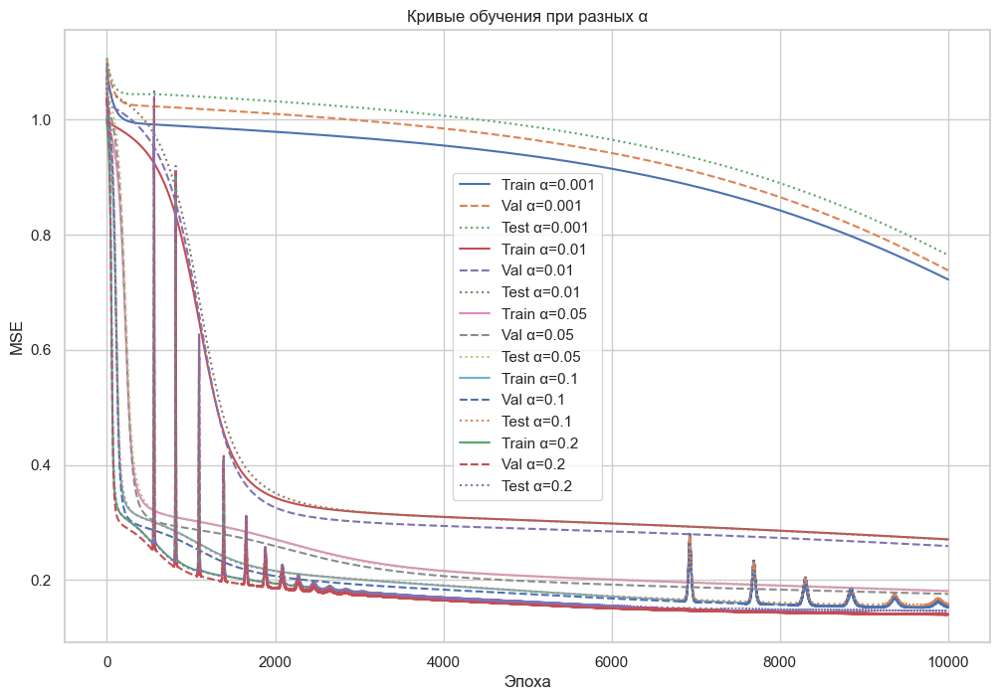

In [31]:
# Фиксация генератора случайных чисел
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)

# Простейшая сеть
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(9, 15)
        self.fc2 = nn.Linear(15, 10)
        self.out = nn.Linear(10, 1)
        self.act = nn.Sigmoid()

    def forward(self, x):
        x = self.act(self.fc1(x))
        x = self.act(self.fc2(x))
        return self.out(x)

# Функция обучения и логирования ошибок
def train_model(X_train, y_train, X_val, y_val, X_test, y_test, lr, epochs=10000):
    set_seed(42)
    model = Net()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=lr)

    train_losses, val_losses, test_losses = [], [], []

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses

lrs = [0.001, 0.01, 0.05, 0.1, 0.2]
results = {}

# Преобразуем DataFrame'ы в тензоры
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val.reshape(-1, 1), dtype=torch.float32)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.reshape(-1, 1), dtype=torch.float32)

for lr in lrs:
    tr, vl, ts = train_model(X_train_tensor, y_train_tensor,
                             X_val_tensor, y_val_tensor,
                             X_test_tensor, y_test_tensor,
                             lr)
    results[lr] = {'train': tr, 'val': vl, 'test': ts}

# Построение графиков
plt.figure(figsize=(12, 8))
for lr in lrs:
    plt.plot(results[lr]['train'], label=f'Train α={lr}')
    plt.plot(results[lr]['val'], '--', label=f'Val α={lr}')
    plt.plot(results[lr]['test'], ':', label=f'Test α={lr}')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.title('Кривые обучения при разных α')
plt.legend()
plt.grid(True)
plt.show()

In [32]:
for lr in lrs:
    print(f"train a = {lr} : {results[lr]['train'][-1]}")
    print(f"test a = {lr} : {results[lr]['test'][-1]}")

train a = 0.001 : 0.7220334410667419
test a = 0.001 : 0.7644388675689697
train a = 0.01 : 0.27069470286369324
test a = 0.01 : 0.27000904083251953
train a = 0.05 : 0.18086937069892883
test a = 0.05 : 0.18076732754707336
train a = 0.1 : 0.15338318049907684
test a = 0.1 : 0.15795697271823883
train a = 0.2 : 0.14053353667259216
test a = 0.2 : 0.14676810801029205


In [33]:
# Зафиксировать генератор случайных чисел
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)

# Простейшая сеть
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(9, 15)
        self.fc2 = nn.Linear(15, 10)
        self.out = nn.Linear(10, 1)
        self.act = nn.Sigmoid()

    def forward(self, x):
        x = self.act(self.fc1(x))
        x = self.act(self.fc2(x))
        return self.out(x)

# Функция обучения модели
def train_model(X_train, y_train, X_val, y_val, X_test, y_test, lr, momentum, use_nag=False, epochs=2000):
    set_seed(42)
    model = Net()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum, nesterov=use_nag)

    train_losses, val_losses, test_losses = [], [], []

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses


In [34]:
best_lr = 0.02
momentums = [0.0001, 0.3, 0.6, 0.9]

results_gdm = {}
results_nag = {}

for mu in momentums:
    # GDM
    tr, vl, ts = train_model(X_train_tensor, y_train_tensor,
                             X_val_tensor, y_val_tensor,
                             X_test_tensor, y_test_tensor,
                             best_lr, momentum=mu, use_nag=False)
    results_gdm[mu] = {'train': tr, 'val': vl, 'test': ts}

    # NAG
    tr, vl, ts = train_model(X_train_tensor, y_train_tensor,
                             X_val_tensor, y_val_tensor,
                             X_test_tensor, y_test_tensor,
                             best_lr, momentum=mu, use_nag=True)
    results_nag[mu] = {'train': tr, 'val': vl, 'test': ts}


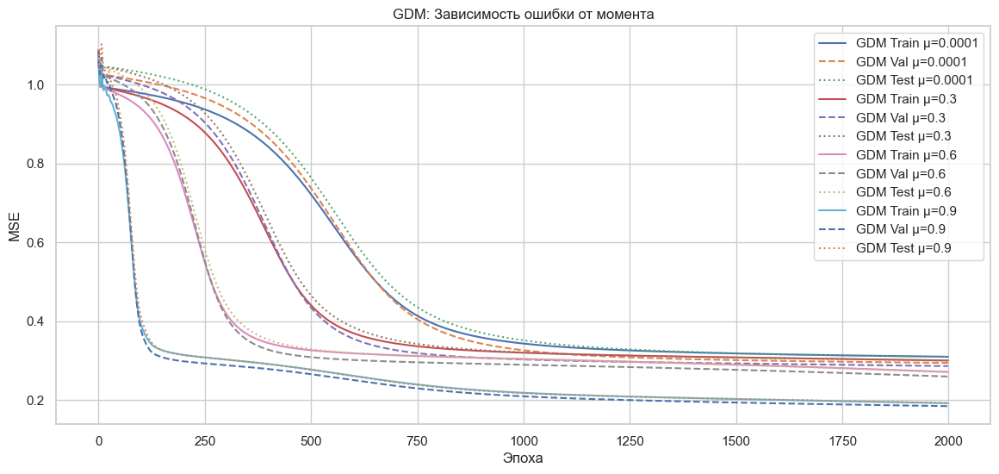

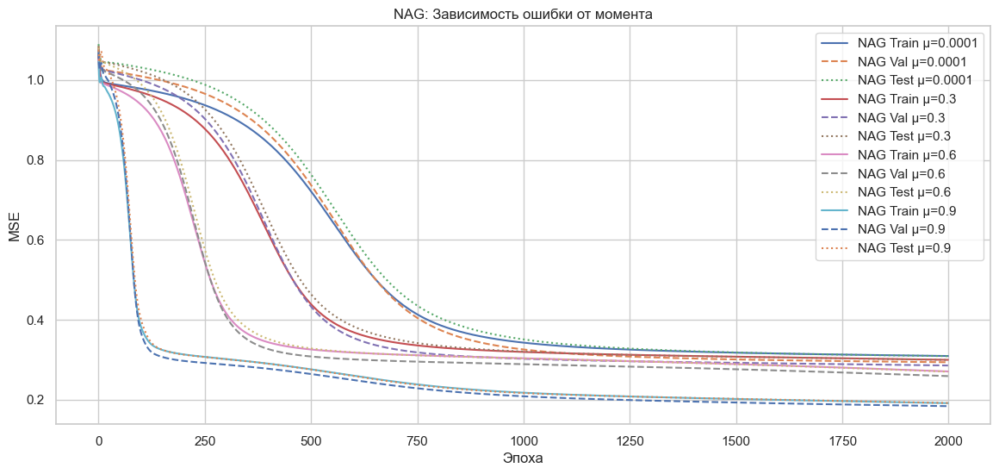

In [35]:
plt.figure(figsize=(14, 6))

for mu in momentums:
    plt.plot(results_gdm[mu]['train'], label=f'GDM Train μ={mu}')
    plt.plot(results_gdm[mu]['val'], '--', label=f'GDM Val μ={mu}')
    plt.plot(results_gdm[mu]['test'], ':', label=f'GDM Test μ={mu}')

plt.title('GDM: Зависимость ошибки от момента')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(14, 6))

for mu in momentums:
    plt.plot(results_nag[mu]['train'], label=f'NAG Train μ={mu}')
    plt.plot(results_nag[mu]['val'], '--', label=f'NAG Val μ={mu}')
    plt.plot(results_nag[mu]['test'], ':', label=f'NAG Test μ={mu}')

plt.title('NAG: Зависимость ошибки от момента')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)
plt.show()


In [36]:
for mu in momentums:
    print(f"Момент GDM: {mu}")
    print(f"Train: {results_gdm[mu]['train'][-1]}")
    print(f"Test: {results_gdm[mu]['test'][-1]}")
    print()

Момент GDM: 0.0001
Train: 0.3095788359642029
Test: 0.3092227578163147

Момент GDM: 0.3
Train: 0.2999914586544037
Test: 0.2996792793273926

Момент GDM: 0.6
Train: 0.27103736996650696
Test: 0.2703677713871002

Момент GDM: 0.9
Train: 0.19171588122844696
Test: 0.19206902384757996



In [37]:
for mu in momentums:
    print(f"Момент NAG: {mu}")
    print(f"Train: {results_nag[mu]['train'][-1]}")
    print(f"Test: {results_nag[mu]['test'][-1]}")
    print()

Момент NAG: 0.0001
Train: 0.3095787763595581
Test: 0.3092227578163147

Момент NAG: 0.3
Train: 0.29996901750564575
Test: 0.29965633153915405

Момент NAG: 0.6
Train: 0.27092352509498596
Test: 0.27024877071380615

Момент NAG: 0.9
Train: 0.19157086312770844
Test: 0.19198085367679596



In [38]:
model = Net()
criterion = nn.MSELoss()

In [39]:
def compute_gradient(model, X, y):
    model.zero_grad()
    output = model(X)
    loss = criterion(output, y)
    loss.backward()
    grads = []
    for param in model.parameters():
        grads.append(param.grad.view(-1))
    return torch.cat(grads), loss.item()


In [40]:
def get_weights(model):
    return torch.cat([p.view(-1) for p in model.parameters()])

def set_weights(model, weights):
    pointer = 0
    for param in model.parameters():
        num_param = param.numel()
        param.data = weights[pointer:pointer+num_param].view(param.size()).clone()
        pointer += num_param


In [41]:
def train_conjugate_gradient(X, y, X_val, y_val, X_test, y_test, method="fr", lr=0.01, epochs=4000):
    model = Net()
    train_losses, val_losses, test_losses = [], [], []

    w = get_weights(model)
    g_prev, _ = compute_gradient(model, X, y)
    d = -g_prev

    for epoch in range(epochs):
        # Линейный шаг
        w = w + lr * d
        set_weights(model, w)

        g, loss = compute_gradient(model, X, y)

        if method == "fr":
            epsilon = 1e-8
            beta = (g @ g) / (g_prev @ g_prev + epsilon)
        elif method == "pr":
            beta = (g @ (g - g_prev)) / (g_prev @ g_prev)
        else:  # steepest descent
            beta = 0

        d = -g + beta * d
        if method == "fr":
            if epoch % 50 == 0:
                d = -g  # сброс направления
        g_prev = g

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X), y).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses


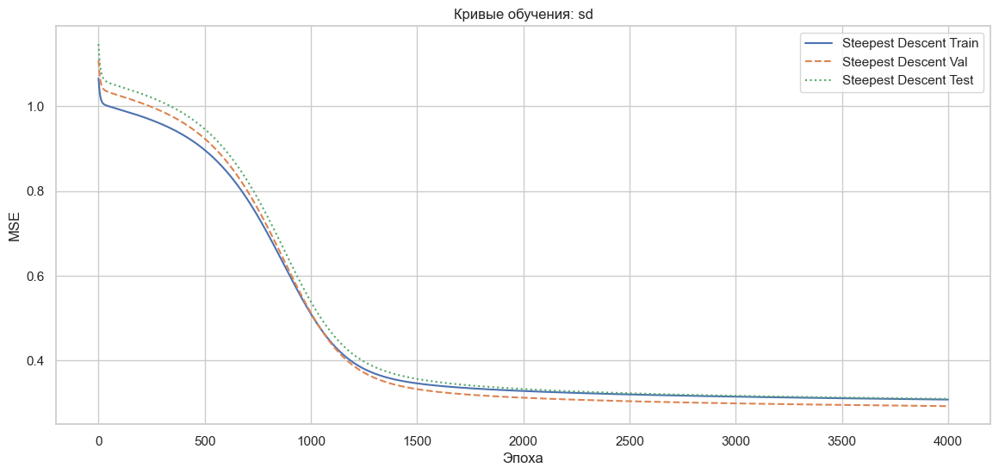

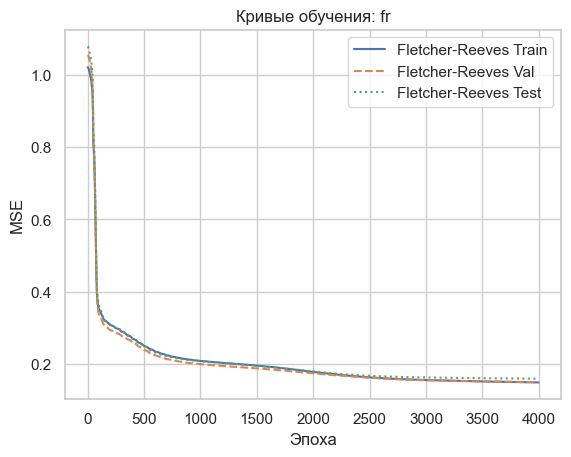

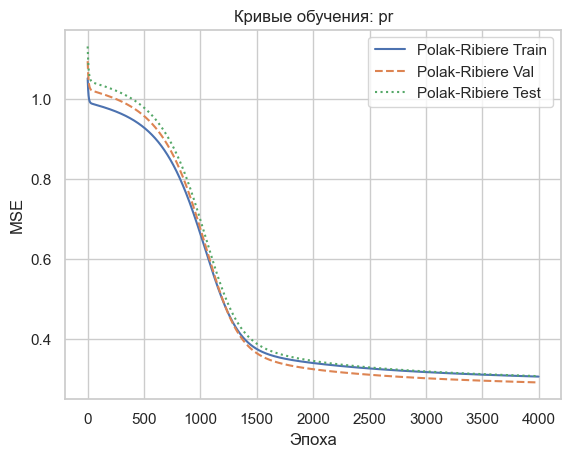

In [42]:
methods = ["sd", "fr", "pr"]
labels = {"sd": "Steepest Descent", "fr": "Fletcher-Reeves", "pr": "Polak-Ribiere"}
results = {}

for method in methods:
    tr, vl, ts = train_conjugate_gradient(X_train_tensor, y_train_tensor,
                                          X_val_tensor, y_val_tensor,
                                          X_test_tensor, y_test_tensor,
                                          method=method)
    results[method] = {'train': tr, 'val': vl, 'test': ts}

plt.figure(figsize=(14, 6))
for method in methods:
    plt.plot(results[method]['train'], label=f'{labels[method]} Train')
    plt.plot(results[method]['val'], '--', label=f'{labels[method]} Val')
    plt.plot(results[method]['test'], ':', label=f'{labels[method]} Test')

    plt.xlabel("Эпоха")
    plt.ylabel("MSE")
    plt.title(f"Кривые обучения: {method}")
    plt.legend()
    plt.grid(True)
    plt.show()


In [43]:
for method in methods:
    print(f"{labels[method]}")
    print(f"Train: {results[method]['train'][-1]}")
    print(f"Test: {results[method]['test'][-1]}")
    print()

Steepest Descent
Train: 0.30792236328125
Test: 0.3095298707485199

Fletcher-Reeves
Train: 0.14993469417095184
Test: 0.16027507185935974

Polak-Ribiere
Train: 0.30502015352249146
Test: 0.30618876218795776



In [44]:
def train_adagrad(X_train, y_train, X_val, y_val, X_test, y_test, lr=0.02, epochs=2000, eps=1e-8):
    model = Net()
    criterion = nn.MSELoss()
    
    # Градиентные кумулятивные суммы
    G = {}
    for name, param in model.named_parameters():
        if param.requires_grad:
            G[name] = torch.zeros_like(param.data)

    train_losses, val_losses, test_losses = [], [], []
    lr_logs = {name: [] for name in G}  # скорость по параметрам
    lr_global_stats = {'min': [], 'max': [], 'mean': []}

    for epoch in range(epochs):
        model.train()
        preds = model(X_train)
        loss = criterion(preds, y_train)

        loss.backward()

        lr_epoch = []

        with torch.no_grad():
            for name, param in model.named_parameters():
                if param.grad is not None:
                    G[name] += param.grad.data ** 2
                    adjusted_lr = lr / (torch.sqrt(G[name]) + eps)
                    param.data -= adjusted_lr * param.grad.data

                    # Логирование скоростей
                    lr_logs[name].append(adjusted_lr.mean().item())
                    lr_epoch.extend(adjusted_lr.flatten().cpu().numpy())

            model.zero_grad()

        # Логирование глобальных статистик по lr
        lr_epoch = np.array(lr_epoch)
        lr_global_stats['min'].append(lr_epoch.min())
        lr_global_stats['max'].append(lr_epoch.max())
        lr_global_stats['mean'].append(lr_epoch.mean())

        # Логируем ошибки
        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses, lr_logs, lr_global_stats

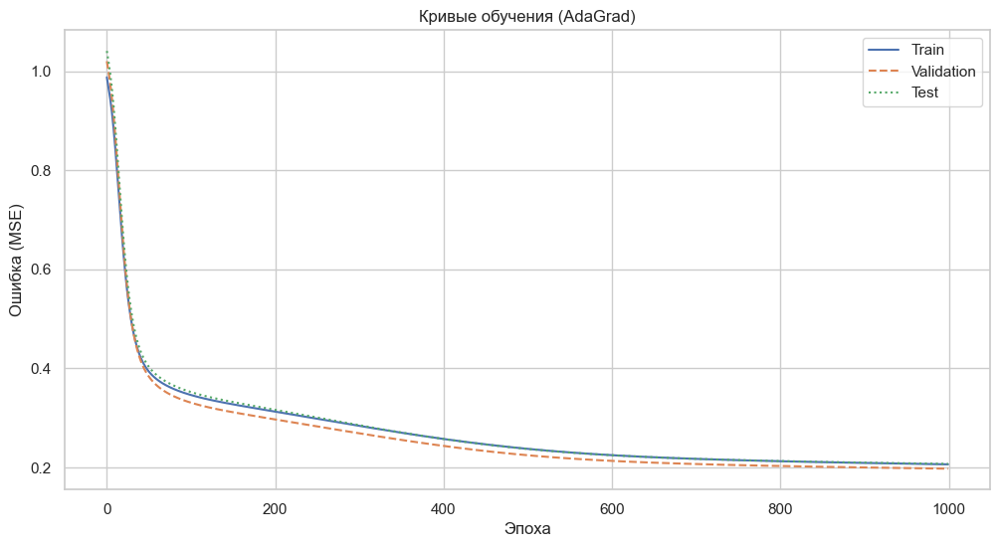

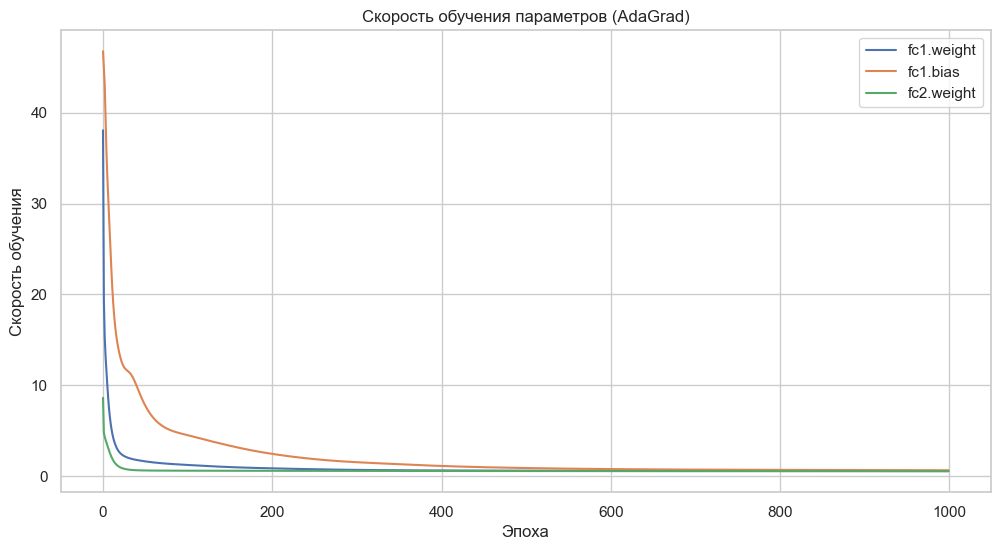

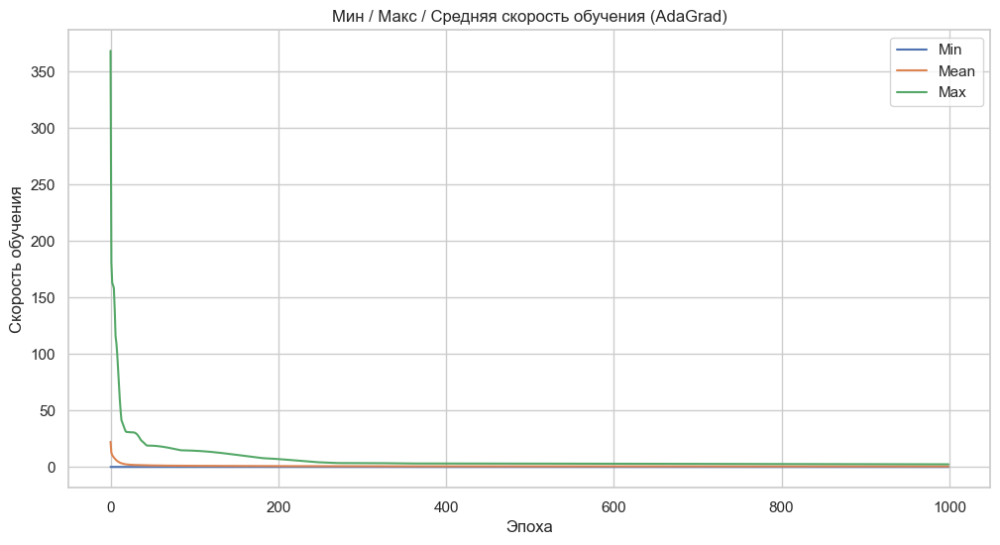

In [45]:
train_losses, val_losses, test_losses, lr_logs, lr_stats = train_adagrad(
    X_train_tensor, y_train_tensor,
    X_val_tensor, y_val_tensor,
    X_test_tensor, y_test_tensor,
    lr=best_lr, epochs=1000
)

# Кривые обучения
plt.figure(figsize=(12, 6))
plt.plot(train_losses, label='Train')
plt.plot(val_losses, '--', label='Validation')
plt.plot(test_losses, ':', label='Test')
plt.xlabel('Эпоха')
plt.ylabel('Ошибка (MSE)')
plt.title('Кривые обучения (AdaGrad)')
plt.legend()
plt.grid(True)
plt.show()

# Выбор нескольких параметров для анализа динамики lr
plt.figure(figsize=(12, 6))
for name in list(lr_logs.keys())[:3]:  # первые 3 параметра (можно выбрать вручную)
    plt.plot(lr_logs[name], label=name)
plt.xlabel('Эпоха')
plt.ylabel('Скорость обучения')
plt.title('Скорость обучения параметров (AdaGrad)')
plt.legend()
plt.grid(True)
plt.show()

# Глобальная статистика по lr
plt.figure(figsize=(12, 6))
plt.plot(lr_stats['min'], label='Min')
plt.plot(lr_stats['mean'], label='Mean')
plt.plot(lr_stats['max'], label='Max')
plt.xlabel('Эпоха')
plt.ylabel('Скорость обучения')
plt.title('Мин / Макс / Средняя скорость обучения (AdaGrad)')
plt.legend()
plt.grid(True)
plt.show()


In [46]:
print("Train: {:.3f}".format(train_losses[-1]))
print("Test: {:.3f}".format(test_losses[-1]))

Train: 0.207
Test: 0.208


In [47]:
def train_rmsprop(X_train, y_train, X_val, y_val, X_test, y_test, 
                  lr=0.02, rho=0.9, eps=1e-8, epochs=2000):
    model = Net()
    criterion = nn.MSELoss()
    E_g2 = {name: torch.zeros_like(param.data) for name, param in model.named_parameters()}

    lr_logs = {name: [] for name in E_g2}
    global_stats = {'min': [], 'max': [], 'mean': []}

    train_losses, val_losses, test_losses = [], [], []

    for epoch in range(epochs):
        model.train()
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()

        lr_epoch = []

        with torch.no_grad():
            for name, param in model.named_parameters():
                if param.grad is not None:
                    grad = param.grad.data
                    E_g2[name] = rho * E_g2[name] + (1 - rho) * grad ** 2
                    adjusted_lr = lr / (torch.sqrt(E_g2[name]) + eps)
                    param.data -= adjusted_lr * grad

                    lr_logs[name].append(adjusted_lr.mean().item())
                    lr_epoch.extend(adjusted_lr.cpu().flatten().numpy())

            model.zero_grad()

        lr_epoch = np.array(lr_epoch)
        global_stats['min'].append(lr_epoch.min())
        global_stats['max'].append(lr_epoch.max())
        global_stats['mean'].append(lr_epoch.mean())

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses, lr_logs, global_stats


In [48]:
def train_adadelta(X_train, y_train, X_val, y_val, X_test, y_test, 
                   rho=0.9, eps=1e-6, epochs=2000):
    model = Net()
    criterion = nn.MSELoss()

    E_g2 = {name: torch.zeros_like(param.data) for name, param in model.named_parameters()}
    E_dx2 = {name: torch.zeros_like(param.data) for name, param in model.named_parameters()}

    lr_logs = {name: [] for name in E_g2}
    global_stats = {'min': [], 'max': [], 'mean': []}

    train_losses, val_losses, test_losses = [], [], []

    for epoch in range(epochs):
        model.train()
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()

        lr_epoch = []

        with torch.no_grad():
            for name, param in model.named_parameters():
                if param.grad is not None:
                    grad = param.grad.data
                    E_g2[name] = rho * E_g2[name] + (1 - rho) * grad ** 2
                    RMS_g = torch.sqrt(E_g2[name] + eps)
                    RMS_dx = torch.sqrt(E_dx2[name] + eps)
                    delta = - (RMS_dx / RMS_g) * grad
                    param.data += delta
                    E_dx2[name] = rho * E_dx2[name] + (1 - rho) * delta ** 2

                    effective_lr = (RMS_dx / RMS_g).mean().item()
                    lr_logs[name].append(effective_lr)
                    lr_epoch.extend((RMS_dx / RMS_g).cpu().flatten().numpy())

            model.zero_grad()

        lr_epoch = np.array(lr_epoch)
        global_stats['min'].append(lr_epoch.min())
        global_stats['max'].append(lr_epoch.max())
        global_stats['mean'].append(lr_epoch.mean())

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses, lr_logs, global_stats


In [49]:
rhos = [0, 0.5, 0.9, 0.99]
results_rmsprop, results_adadelta = {}, {}

for rho in rhos:
    print(f"Training RMSProp with ρ={rho}")
    tr, vl, ts, lr_logs, stats = train_rmsprop(X_train_tensor, y_train_tensor,
                                               X_val_tensor, y_val_tensor,
                                               X_test_tensor, y_test_tensor,
                                               lr=best_lr, rho=rho)
    results_rmsprop[rho] = {'train': tr, 'val': vl, 'test': ts, 'lrs': lr_logs, 'stats': stats}

    print(f"Training AdaDelta with ρ={rho}")
    tr, vl, ts, lr_logs, stats = train_adadelta(X_train_tensor, y_train_tensor,
                                                X_val_tensor, y_val_tensor,
                                                X_test_tensor, y_test_tensor,
                                                rho=rho)
    results_adadelta[rho] = {'train': tr, 'val': vl, 'test': ts, 'lrs': lr_logs, 'stats': stats}


Training RMSProp with ρ=0
Training AdaDelta with ρ=0
Training RMSProp with ρ=0.5
Training AdaDelta with ρ=0.5
Training RMSProp with ρ=0.9
Training AdaDelta with ρ=0.9
Training RMSProp with ρ=0.99
Training AdaDelta with ρ=0.99


In [50]:
def plot_errors(results, title):
    plt.figure(figsize=(12, 6))
    for rho in results:
        plt.plot(results[rho]['train'], label=f'Train ρ={rho}')
        plt.plot(results[rho]['val'], '--', label=f'Val ρ={rho}')
        plt.plot(results[rho]['test'], ':', label=f'Test ρ={rho}')
    plt.xlabel("Эпоха")
    plt.ylabel("MSE")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_lr_dynamics(results, title):
    for rho in results:
        stats = results[rho]['stats']
        plt.figure(figsize=(10, 5))
        plt.plot(stats['min'], label='Min')
        plt.plot(stats['mean'], label='Mean')
        plt.plot(stats['max'], label='Max')
        plt.title(f"{title} ρ={rho}")
        plt.xlabel("Эпоха")
        plt.ylabel("Скорость обучения")
        plt.legend()
        plt.grid(True)
        plt.show()


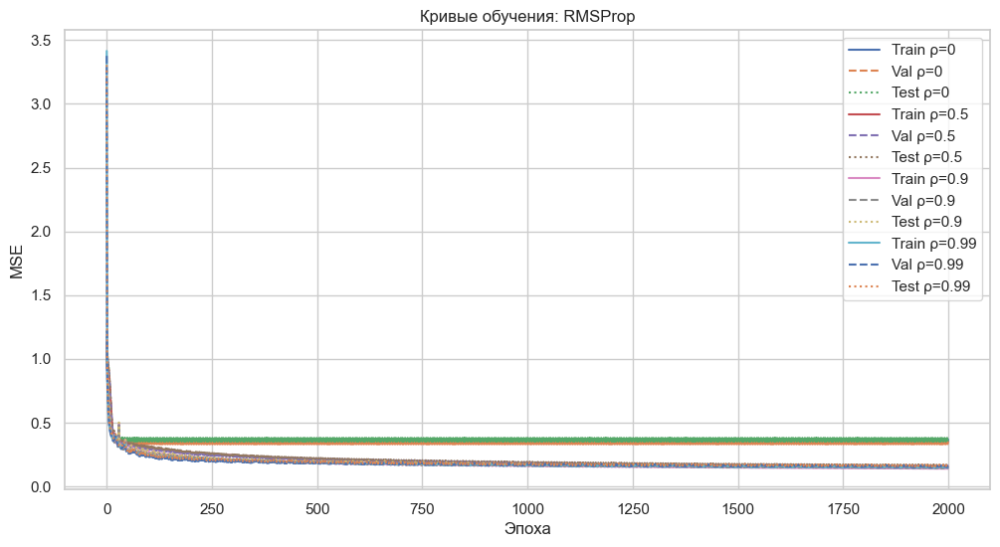

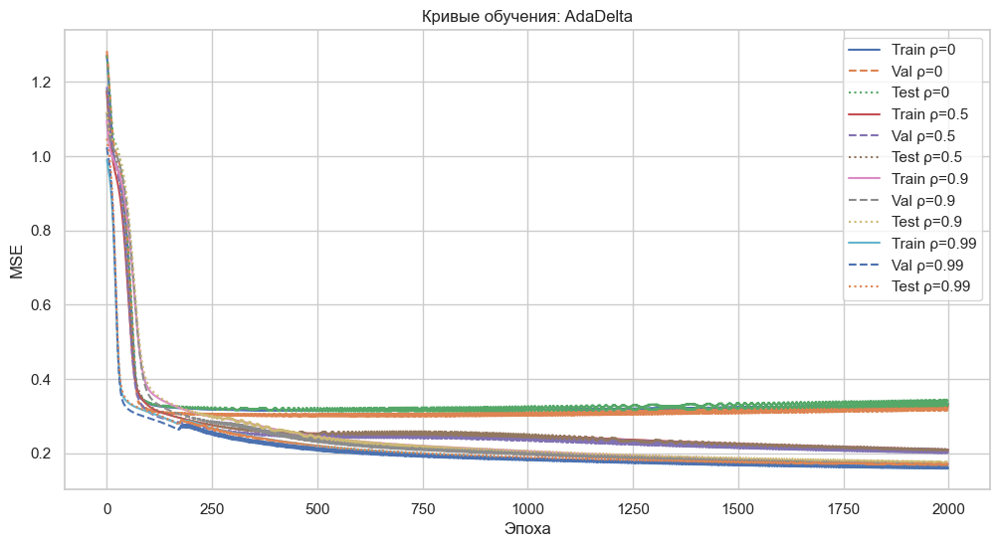

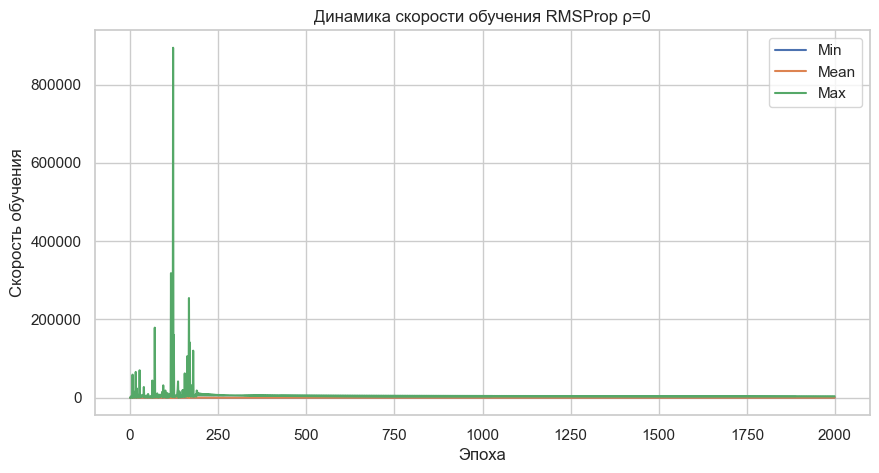

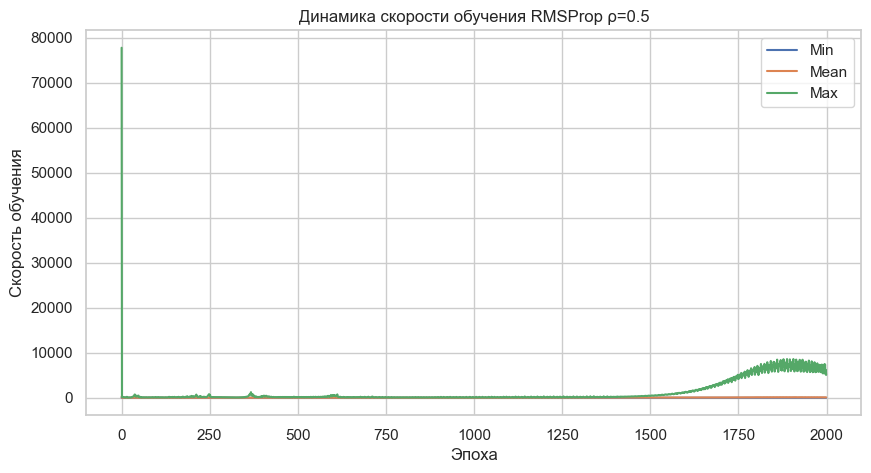

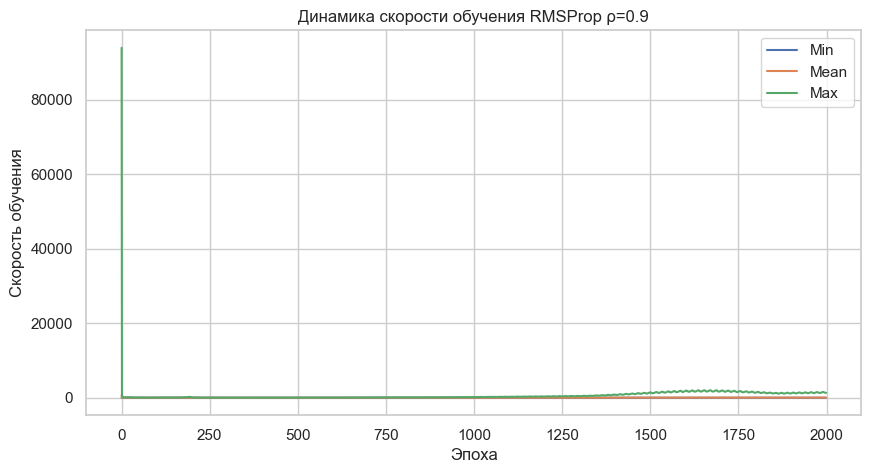

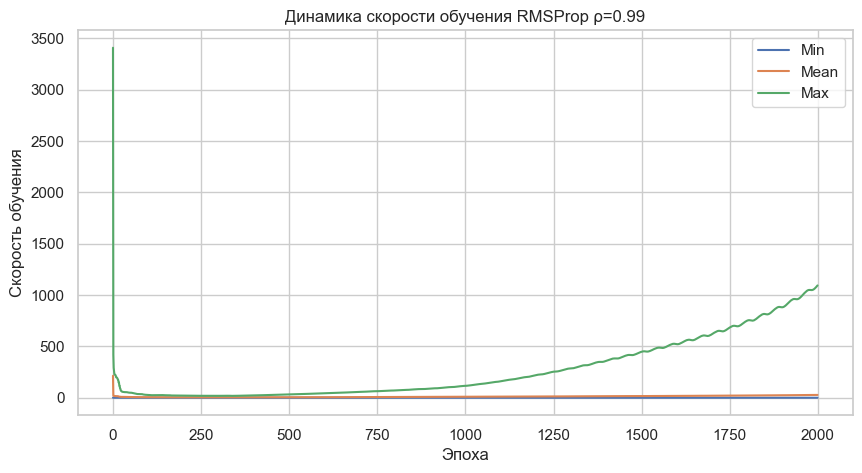

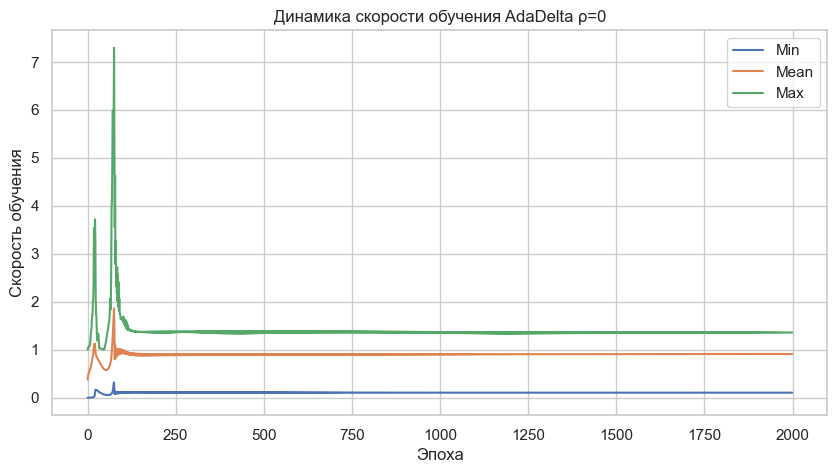

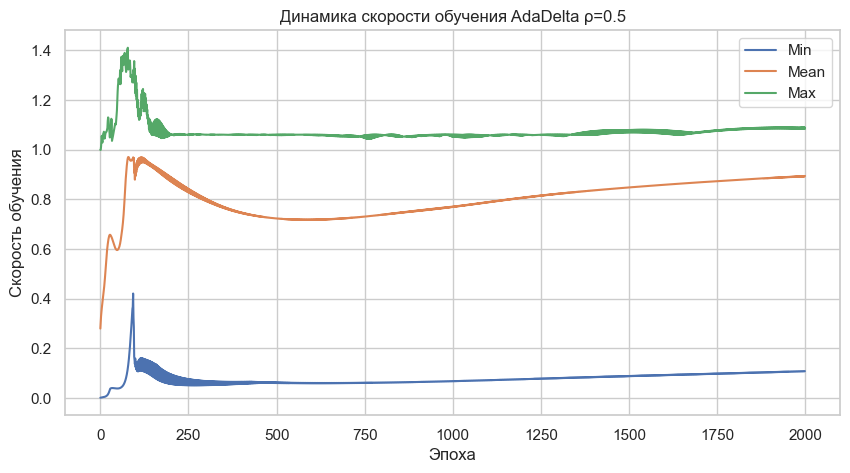

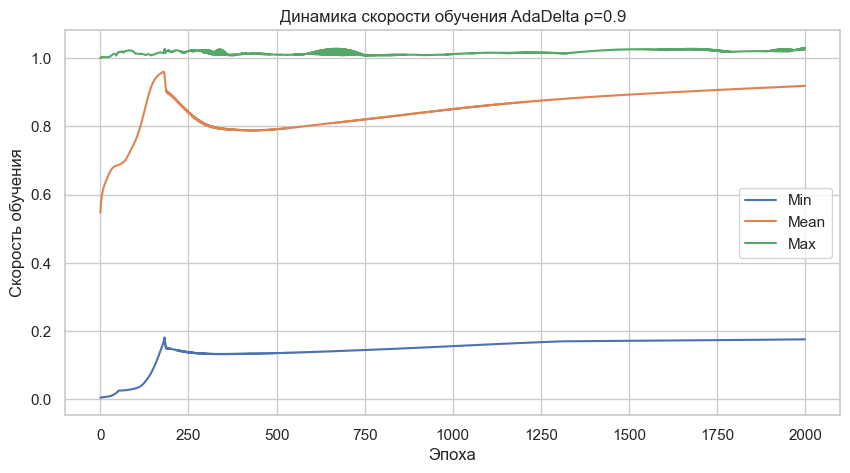

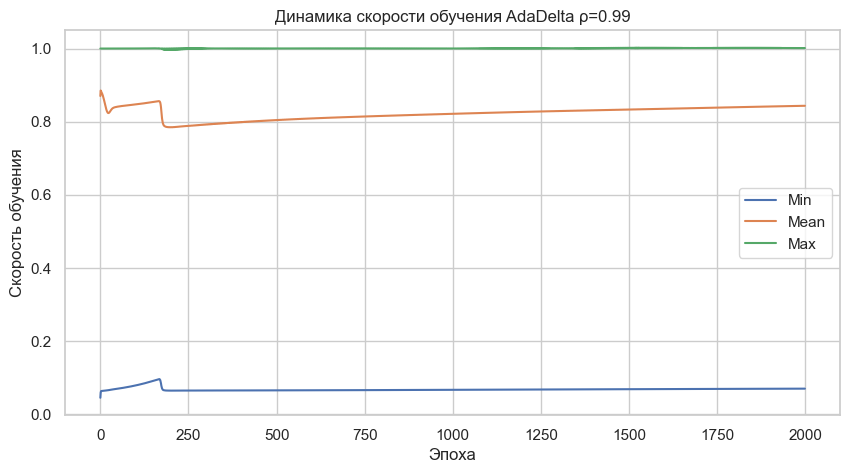

In [51]:
plot_errors(results_rmsprop, "Кривые обучения: RMSProp")
plot_errors(results_adadelta, "Кривые обучения: AdaDelta")

plot_lr_dynamics(results_rmsprop, "Динамика скорости обучения RMSProp")
plot_lr_dynamics(results_adadelta, "Динамика скорости обучения AdaDelta")


In [52]:
for rho in rhos:
    print(f"RMSProp ρ={rho}: {round(results_rmsprop[rho]['train'][-1], 3)}")
    print(f"RMSProp ρ={rho}: {round(results_rmsprop[rho]['test'][-1], 3)}")

RMSProp ρ=0: 0.37
RMSProp ρ=0: 0.381
RMSProp ρ=0.5: 0.154
RMSProp ρ=0.5: 0.164
RMSProp ρ=0.9: 0.139
RMSProp ρ=0.9: 0.157
RMSProp ρ=0.99: 0.147
RMSProp ρ=0.99: 0.164


In [53]:
for rho in rhos:
    print(f"AdaDelta ρ={rho}: {round(results_adadelta[rho]['train'][-1], 3)}") 
    print(f"AdaDelta ρ={rho}: {round(results_adadelta[rho]['test'][-1], 3)}")

AdaDelta ρ=0: 0.331
AdaDelta ρ=0: 0.327
AdaDelta ρ=0.5: 0.21
AdaDelta ρ=0.5: 0.207
AdaDelta ρ=0.9: 0.171
AdaDelta ρ=0.9: 0.175
AdaDelta ρ=0.99: 0.16
AdaDelta ρ=0.99: 0.172


In [54]:
def train_adam(X_train, y_train, X_val, y_val, X_test, y_test,
               lr=0.2, beta1=0.9, beta2=0.999, eps=1e-8, epochs=1000):
    model = Net()
    criterion = nn.MSELoss()

    m = {name: torch.zeros_like(param.data) for name, param in model.named_parameters()}
    v = {name: torch.zeros_like(param.data) for name, param in model.named_parameters()}

    lr_logs = {name: [] for name in m}
    global_stats = {'min': [], 'max': [], 'mean': []}

    train_losses, val_losses, test_losses = [], [], []

    for epoch in range(1, epochs + 1):
        model.train()
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()

        lr_epoch = []

        with torch.no_grad():
            for name, param in model.named_parameters():
                if param.grad is not None:
                    grad = param.grad.data

                    m[name] = beta1 * m[name] + (1 - beta1) * grad
                    v[name] = beta2 * v[name] + (1 - beta2) * grad.pow(2)

                    m_hat = m[name] / (1 - beta1 ** epoch)
                    v_hat = v[name] / (1 - beta2 ** epoch)

                    update = lr * m_hat / (v_hat.sqrt() + eps)
                    param.data -= update

                    lr_logs[name].append((lr * m_hat / (v_hat.sqrt() + eps)).mean().item())
                    lr_epoch.extend((lr * m_hat / (v_hat.sqrt() + eps)).cpu().flatten().numpy())

            model.zero_grad()

        lr_epoch = np.array(lr_epoch)
        global_stats['min'].append(lr_epoch.min())
        global_stats['max'].append(lr_epoch.max())
        global_stats['mean'].append(lr_epoch.mean())

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses, lr_logs, global_stats


In [55]:
betas = [
    (0.5, 0.95),
    (0.9, 0.95),
    (0.9, 0.999),     # стандартные значения
    (0.5, 0.9),
    (0.95, 0.99),
    (0.99, 0.99)  # из предыдущего RMSProp анализа
]

results_adam = {}

for b1, b2 in betas:
    print(f"Training Adam with β1={b1}, β2={b2}")
    tr, vl, ts, lrs, stats = train_adam(X_train_tensor, y_train_tensor,
                                        X_val_tensor, y_val_tensor,
                                        X_test_tensor, y_test_tensor,
                                        lr=best_lr, beta1=b1, beta2=b2)
    results_adam[(b1, b2)] = {'train': tr, 'val': vl, 'test': ts, 'lrs': lrs, 'stats': stats}


Training Adam with β1=0.5, β2=0.95
Training Adam with β1=0.9, β2=0.95
Training Adam with β1=0.9, β2=0.999
Training Adam with β1=0.5, β2=0.9
Training Adam with β1=0.95, β2=0.99
Training Adam with β1=0.99, β2=0.99


In [56]:
def plot_adam_errors(results):
    plt.figure(figsize=(12, 6))
    for (b1, b2), res in results.items():
        label = f"β1={b1}, β2={b2}"
        plt.plot(res['train'], label=f'Train {label}')
        plt.plot(res['val'], '--', label=f'Val {label}')
        plt.plot(res['test'], ':', label=f'Test {label}')
    plt.title("Кривые обучения (Adam)")
    plt.xlabel("Эпоха")
    plt.ylabel("MSE")
    plt.grid(True)
    plt.legend()
    plt.show()


In [57]:
def plot_adam_lr_dynamics(results):
    for (b1, b2), res in results.items():
        stats = res['stats']
        plt.figure(figsize=(10, 5))
        plt.plot(stats['min'], label='Min')
        plt.plot(stats['mean'], label='Mean')
        plt.plot(stats['max'], label='Max')
        plt.title(f"Динамика lr (Adam): β1={b1}, β2={b2}")
        plt.xlabel("Эпоха")
        plt.ylabel("Скорость обучения")
        plt.grid(True)
        plt.legend()
        plt.show()



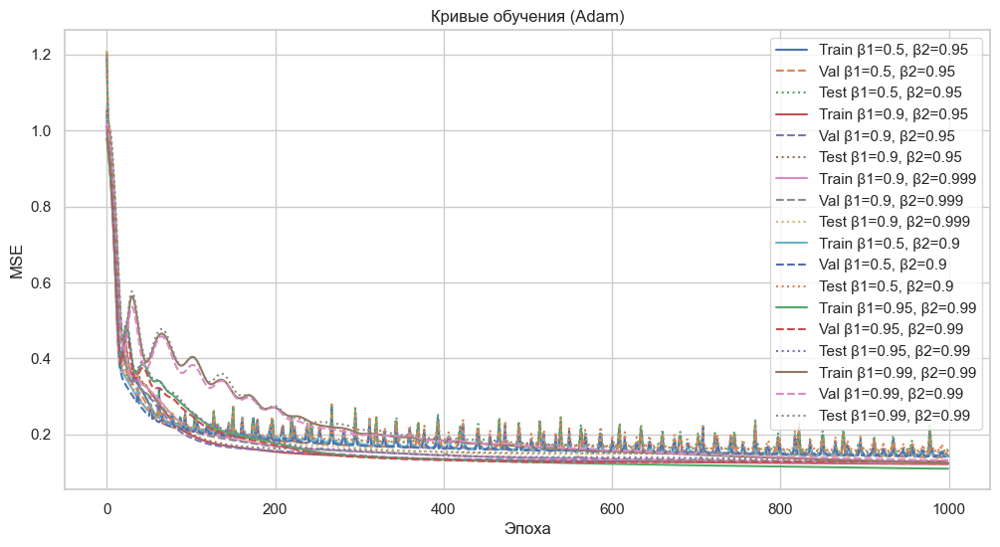

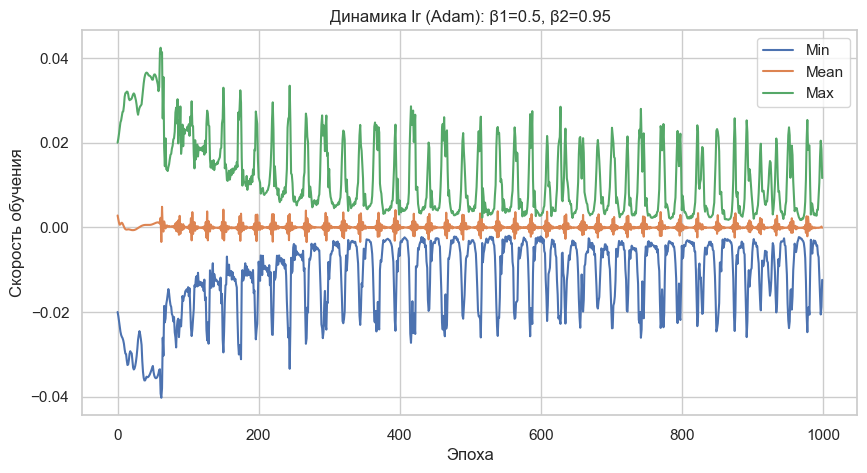

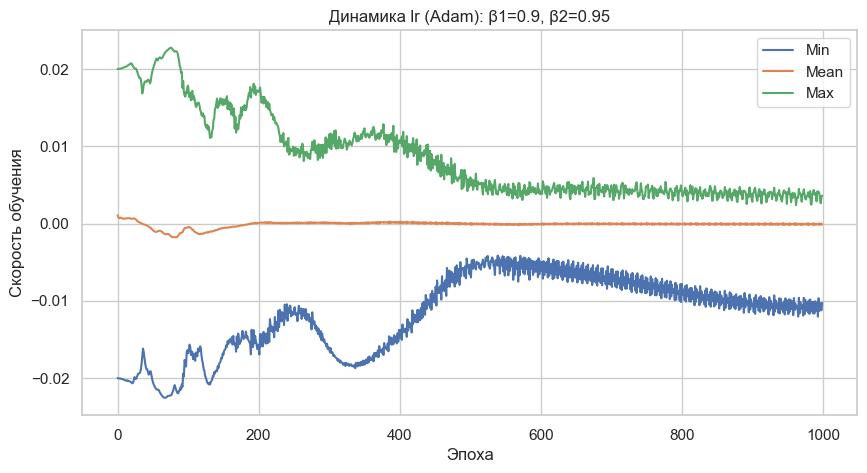

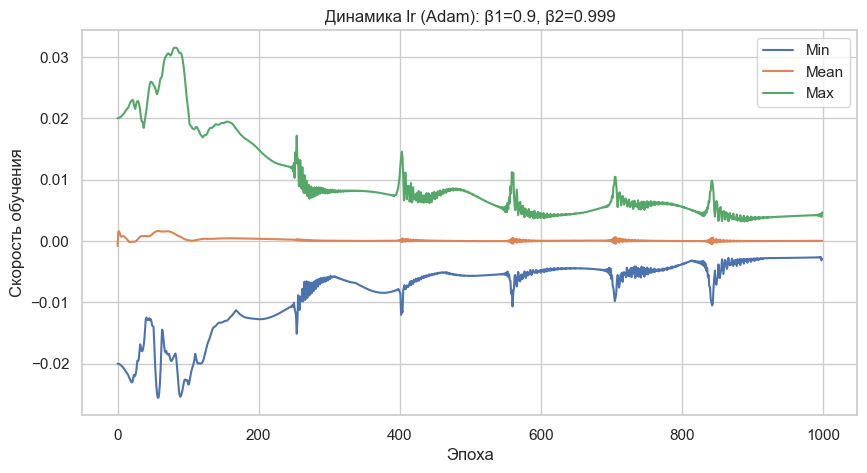

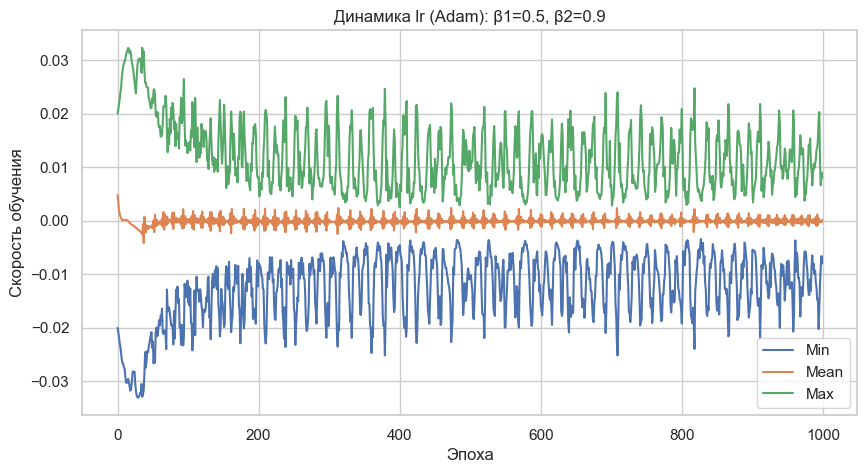

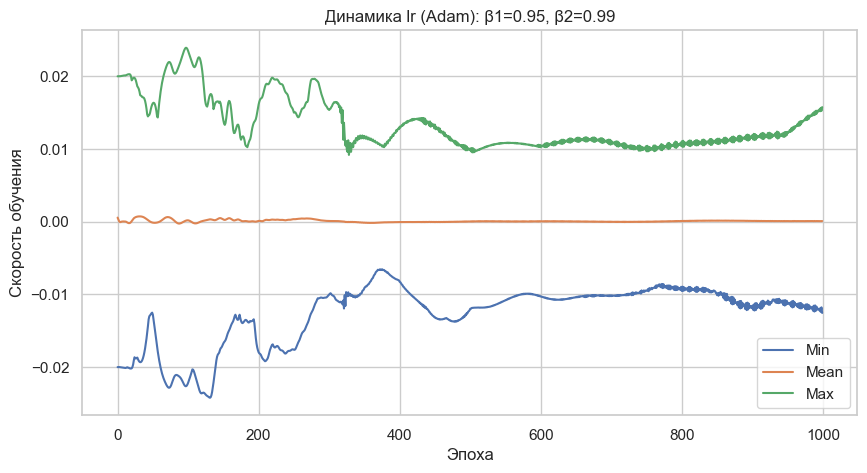

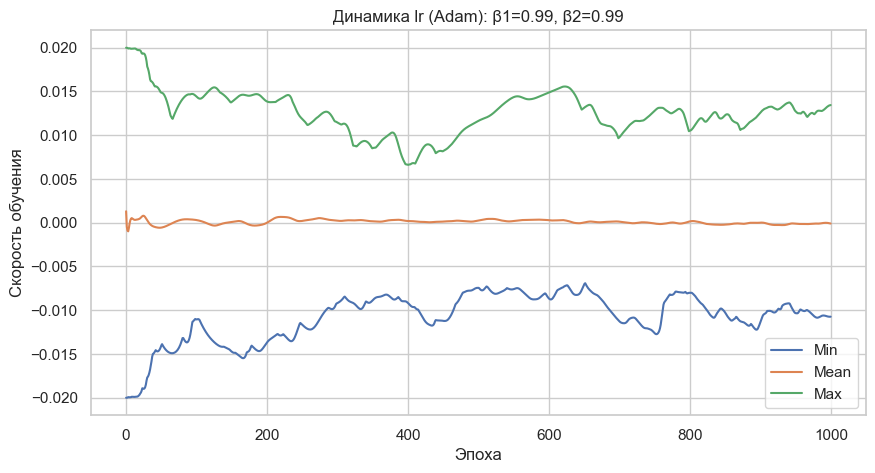

In [58]:
plot_adam_errors(results_adam)
plot_adam_lr_dynamics(results_adam)


In [59]:
for (b1, b2) in betas:
    print(f"Adam β1={b1}, β2={b2}: {round(results_adam[(b1, b2)]['train'][-1], 3)}")
    print(f"Adam β1={b1}, β2={b2}: {round(results_adam[(b1, b2)]['test'][-1], 3)}")

Adam β1=0.5, β2=0.95: 0.142
Adam β1=0.5, β2=0.95: 0.154
Adam β1=0.9, β2=0.95: 0.122
Adam β1=0.9, β2=0.95: 0.146
Adam β1=0.9, β2=0.999: 0.125
Adam β1=0.9, β2=0.999: 0.144
Adam β1=0.5, β2=0.9: 0.144
Adam β1=0.5, β2=0.9: 0.159
Adam β1=0.95, β2=0.99: 0.11
Adam β1=0.95, β2=0.99: 0.131
Adam β1=0.99, β2=0.99: 0.125
Adam β1=0.99, β2=0.99: 0.145


In [60]:
def train_rprop(X_train, y_train, X_val, y_val, X_test, y_test,
                epochs=100, eta_plus=1.2, eta_minus=0.5, delta_init=0.1, delta_min=1e-6, delta_max=50):
    model = Net()
    criterion = nn.MSELoss()

    prev_grads = {}
    deltas = {}
    updates_log = {}
    stats_log = {'min': [], 'max': [], 'mean': []}

    for name, param in model.named_parameters():
        deltas[name] = torch.full_like(param.data, delta_init)
        prev_grads[name] = torch.zeros_like(param.data)
        updates_log[name] = []

    train_losses, val_losses, test_losses = [], [], []

    for epoch in range(epochs):
        model.train()
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()

        epoch_updates = []

        with torch.no_grad():
            for name, param in model.named_parameters():
                if param.grad is not None:
                    grad = param.grad.data
                    prev_grad = prev_grads[name]
                    delta = deltas[name]

                    sign_change = grad * prev_grad
                    delta = torch.where(sign_change > 0, torch.clamp(delta * eta_plus, max=delta_max),
                                        torch.where(sign_change < 0, torch.clamp(delta * eta_minus, min=delta_min), delta))

                    direction = grad.sign()
                    update = -direction * delta
                    param.data += update

                    prev_grads[name] = grad
                    deltas[name] = delta

                    updates_log[name].append(delta.mean().item())
                    epoch_updates.extend(delta.cpu().flatten().numpy())

            model.zero_grad()

        epoch_updates = np.array(epoch_updates)
        stats_log['min'].append(epoch_updates.min())
        stats_log['max'].append(epoch_updates.max())
        stats_log['mean'].append(epoch_updates.mean())

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses, updates_log, stats_log


In [61]:
def plot_rprop_errors(train, val, test):
    plt.figure(figsize=(10, 6))
    plt.plot(train, label='Train')
    plt.plot(val, label='Validation')
    plt.plot(test, label='Test')
    plt.title("Кривые обучения (RProp)")
    plt.xlabel("Эпоха")
    plt.ylabel("MSE")
    plt.legend()
    plt.grid(True)
    plt.show()


In [62]:
def plot_individual_deltas(updates_log, keys):
    for key in keys:
        plt.figure(figsize=(10, 4))
        plt.plot(updates_log[key])
        plt.title(f"Δ для параметра {key}")
        plt.xlabel("Эпоха")
        plt.ylabel("Среднее Δ")
        plt.grid(True)
        plt.show()


In [63]:
def plot_delta_stats(stats):
    plt.figure(figsize=(10, 5))
    plt.plot(stats['min'], label='Min Δ')
    plt.plot(stats['mean'], label='Mean Δ')
    plt.plot(stats['max'], label='Max Δ')
    plt.title("Глобальная динамика Δ (всех параметров)")
    plt.xlabel("Эпоха")
    plt.ylabel("Значение Δ")
    plt.legend()
    plt.grid(True)
    plt.show()


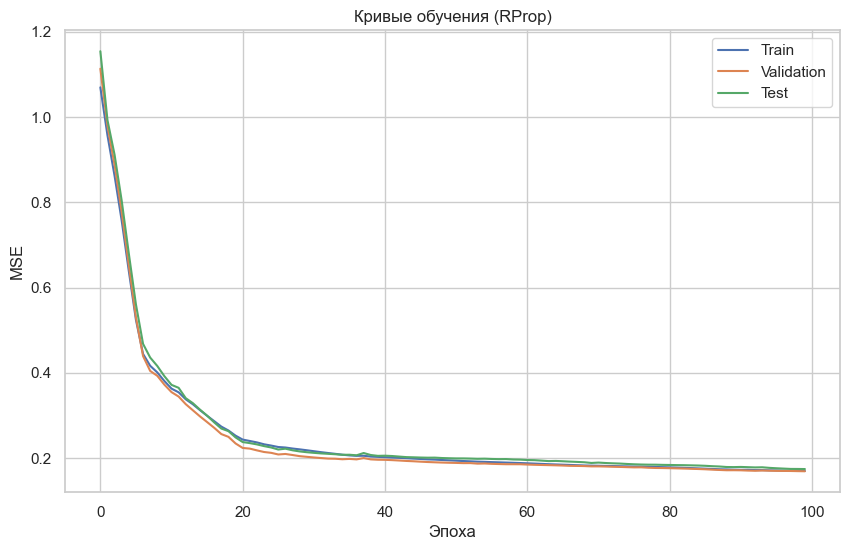

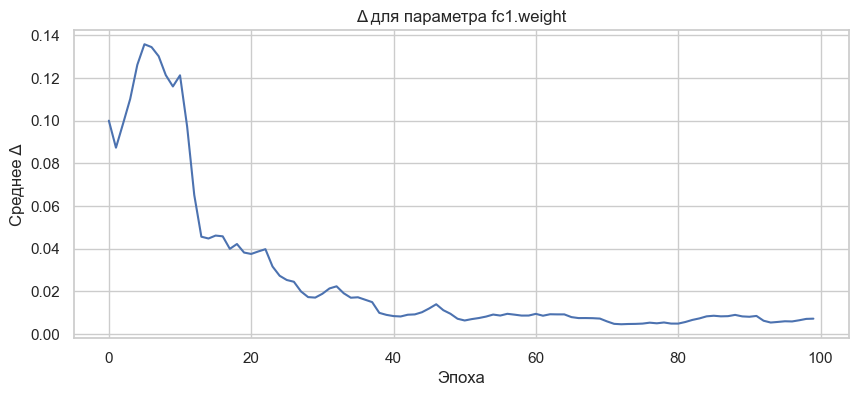

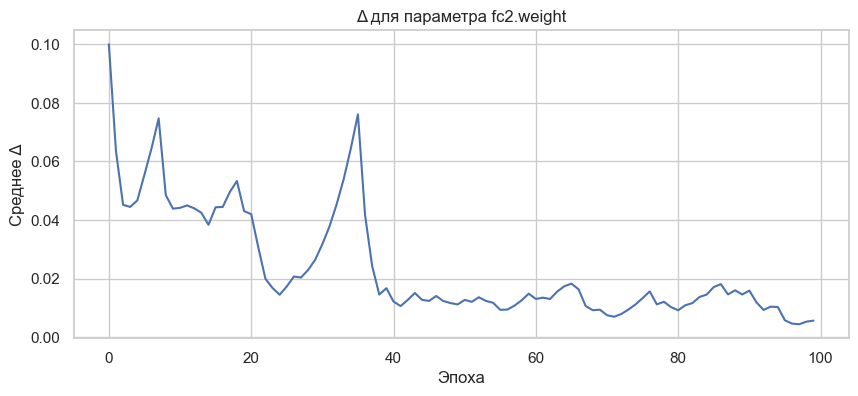

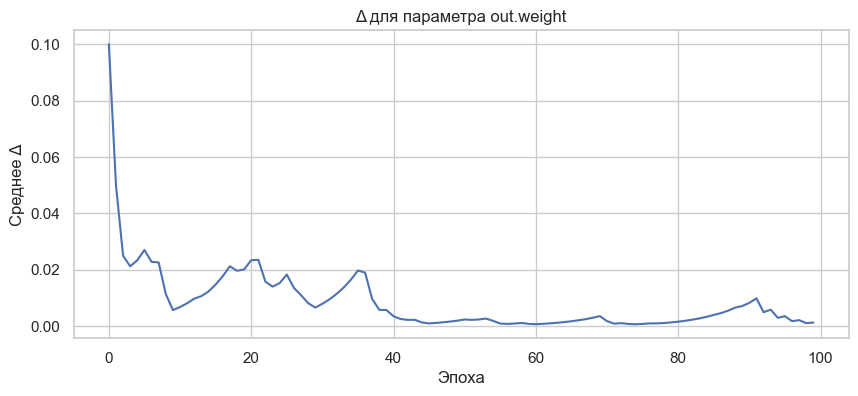

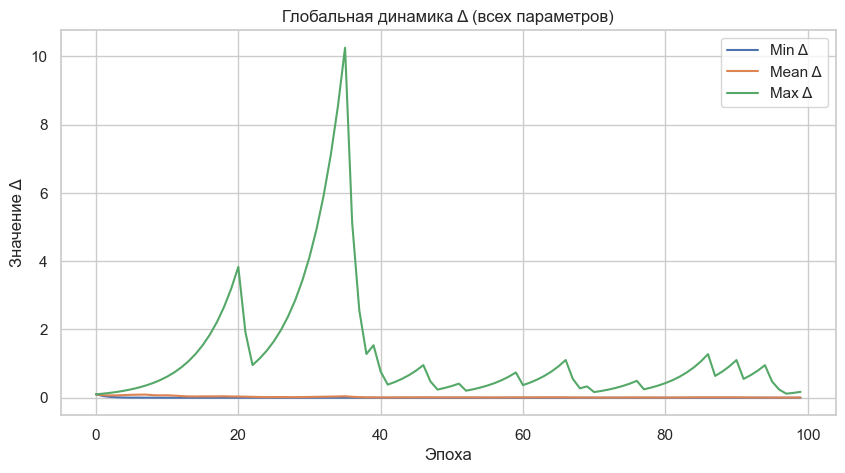

In [64]:
train_rprop_result = train_rprop(X_train_tensor, y_train_tensor,
                                 X_val_tensor, y_val_tensor,
                                 X_test_tensor, y_test_tensor)

tr_loss, val_loss, test_loss, update_logs, global_stats = train_rprop_result

plot_rprop_errors(tr_loss, val_loss, test_loss)
plot_individual_deltas(update_logs, ['fc1.weight', 'fc2.weight', 'out.weight'])
plot_delta_stats(global_stats)


In [65]:
print("Train: {:.3f}".format(tr_loss[-1]))
print("Test: {:.3f}".format(test_loss[-1]))

Train: 0.170
Test: 0.174


In [66]:
def get_flat_params(model):
    return torch.cat([p.detach().flatten() for p in model.parameters()])

def set_flat_params(model, flat_params):
    idx = 0
    for p in model.parameters():
        numel = p.numel()
        p.data = flat_params[idx:idx+numel].view_as(p).clone().detach()
        idx += numel


In [67]:


def train_with_scipy(X_train, y_train, X_val, y_val, X_test, y_test, method="BFGS", max_iter=100):
    model = Net()
    criterion = nn.MSELoss()

    def closure(params_np):
        params = torch.tensor(params_np, dtype=torch.float32)
        set_flat_params(model, params)
        model.eval()
        output = model(X_train)
        loss = criterion(output, y_train)
        return loss.item()

    def grad_fn(params_np):
        params = torch.tensor(params_np, dtype=torch.float32, requires_grad=True)
        set_flat_params(model, params)
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()
        grad = torch.cat([p.grad.detach().flatten() for p in model.parameters()])
        return grad.numpy()

    initial_params = get_flat_params(model).detach().numpy()

    loss_history = {'train': [], 'val': [], 'test': []}

    for i in range(max_iter):
        res = minimize(closure, initial_params, method=method, jac=grad_fn,
                       options={'maxiter': 1, 'disp': False})
        initial_params = res.x
        set_flat_params(model, torch.tensor(initial_params, dtype=torch.float32))

        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        loss_history['train'].append(train_loss)
        loss_history['val'].append(val_loss)
        loss_history['test'].append(test_loss)

    return loss_history


In [68]:
def plot_losses(losses, title):
    plt.figure(figsize=(10, 6))
    plt.plot(losses['train'], label='Train')
    plt.plot(losses['val'], label='Validation')
    plt.plot(losses['test'], label='Test')
    plt.title(title)
    plt.xlabel("Итерации")
    plt.ylabel("MSE")
    plt.legend()
    plt.grid(True)
    plt.show()


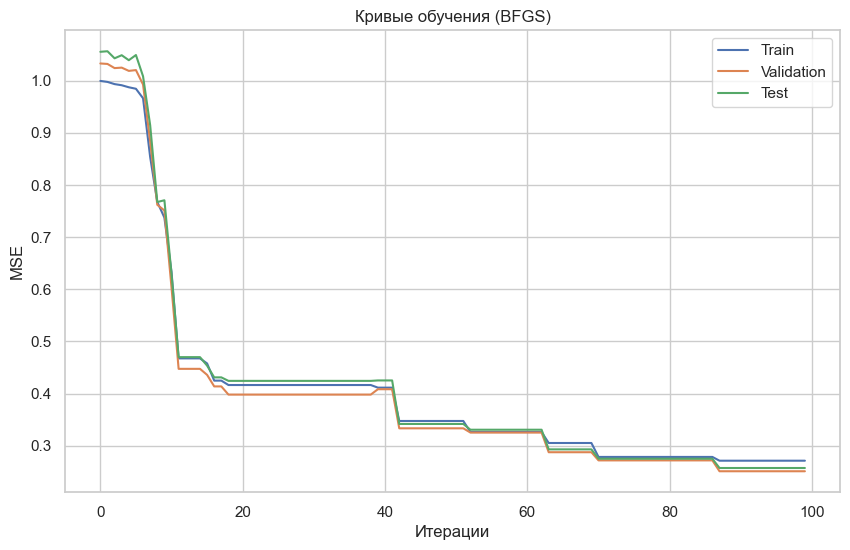

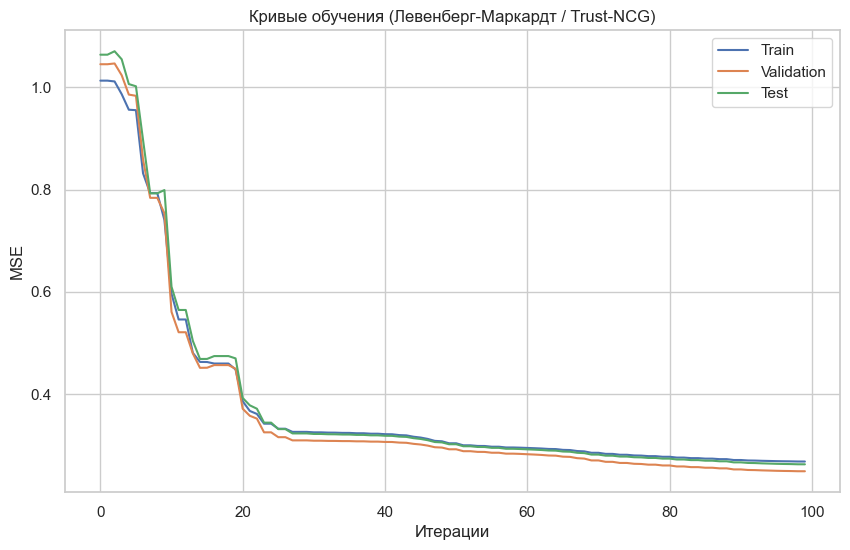

In [69]:
bfgs_losses = train_with_scipy(X_train_tensor, y_train_tensor,
                               X_val_tensor, y_val_tensor,
                               X_test_tensor, y_test_tensor,
                               method='BFGS')

lm_losses = train_with_scipy(X_train_tensor, y_train_tensor,
                             X_val_tensor, y_val_tensor,
                             X_test_tensor, y_test_tensor,
                             method='L-BFGS-B')

plot_losses(bfgs_losses, "Кривые обучения (BFGS)")
plot_losses(lm_losses, "Кривые обучения (Левенберг-Маркардт / Trust-NCG)")


In [70]:
print("Train: {:.3f}".format(bfgs_losses['train'][-1]))
print("Test: {:.3f}".format(bfgs_losses['test'][-1]))

Train: 0.272
Test: 0.258


In [71]:
print("Train: {:.3f}".format(lm_losses['train'][-1]))
print("Test: {:.3f}".format(lm_losses['test'][-1]))

Train: 0.268
Test: 0.263


In [72]:
def train_model_batch(X_train, y_train, X_val, y_val, X_test, y_test, lr, batch_size, epochs=50):
    set_seed(42)
    model = Net()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=lr)

    train_losses, val_losses, test_losses = [], [], []

    dataset = torch.utils.data.TensorDataset(X_train, y_train)
    loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    for epoch in range(epochs):
        model.train()
        for xb, yb in loader:
            optimizer.zero_grad()
            output = model(xb)
            loss = criterion(output, yb)
            loss.backward()
            optimizer.step()

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()
            test_loss = criterion(model(X_test), y_test).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses


In [73]:
batch_sizes = [1, 20, 100, len(X_train_tensor)] 
results_batch = {}
best_lr = 0.02  

for bs in batch_sizes:
    tr, vl, ts = train_model_batch(X_train_tensor, y_train_tensor,
                                   X_val_tensor, y_val_tensor,
                                   X_test_tensor, y_test_tensor,
                                   lr=best_lr, batch_size=bs)
    results_batch[bs] = {'train': tr, 'val': vl, 'test': ts}


In [74]:
len(X_train_tensor)

5244

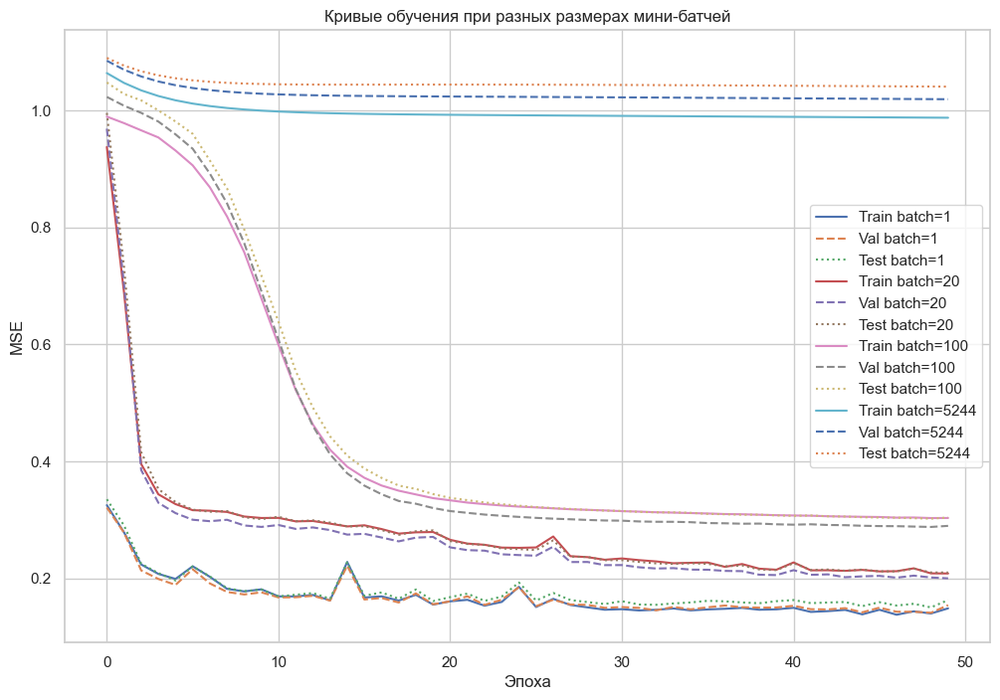

In [75]:
plt.figure(figsize=(12, 8))
for bs in batch_sizes:
    plt.plot(results_batch[bs]['train'], label=f'Train batch={bs}')
    plt.plot(results_batch[bs]['val'], '--', label=f'Val batch={bs}')
    plt.plot(results_batch[bs]['test'], ':', label=f'Test batch={bs}')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.title('Кривые обучения при разных размерах мини-батчей')
plt.legend()
plt.grid(True)
plt.show()


In [76]:
final_errors = {'train': [], 'test': []}
batch_sizes = sorted(results_batch.keys())  # Упорядочим для графика

for bs in batch_sizes:
    final_train_error = results_batch[bs]['train'][-1]  # Последняя ошибка на обучении
    final_test_error = results_batch[bs]['test'][-1]    # Последняя ошибка на тесте

    final_errors['train'].append(final_train_error)
    final_errors['test'].append(final_test_error)


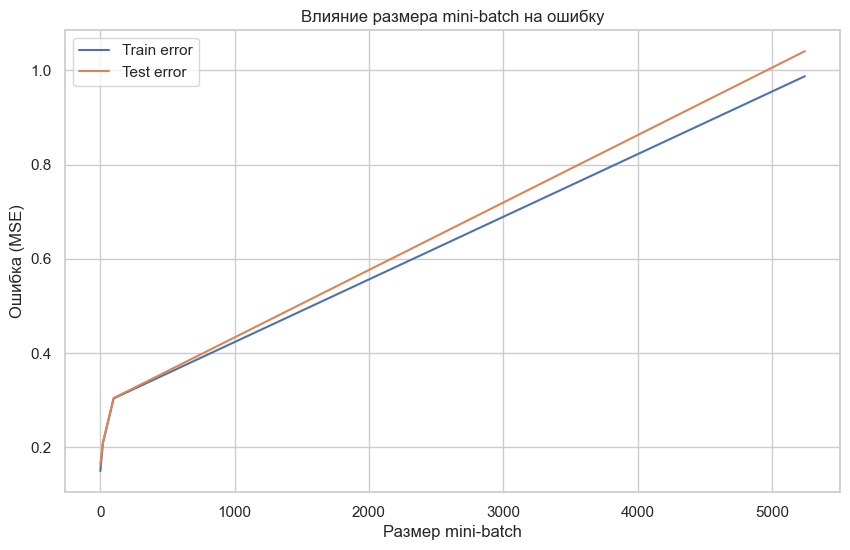

In [77]:
plt.figure(figsize=(10, 6))
plt.plot(batch_sizes, final_errors['train'], label='Train error')
plt.plot(batch_sizes, final_errors['test'], label='Test error')
plt.xlabel('Размер mini-batch')
plt.ylabel('Ошибка (MSE)')
plt.title('Влияние размера mini-batch на ошибку')
plt.grid(True)
plt.legend()
plt.show()


In [78]:
for bs in batch_sizes:
    print(f"Train batch={bs}: {round(results_batch[bs]['train'][-1], 3)}")
    print(f"Test batch={bs}: {round(results_batch[bs]['test'][-1], 3)}")

Train batch=1: 0.149
Test batch=1: 0.163
Train batch=20: 0.209
Test batch=20: 0.21
Train batch=100: 0.303
Test batch=100: 0.304
Train batch=5244: 0.988
Test batch=5244: 1.041


In [79]:
epochs_dict = {
    'GD': 10000,
    'SGD': 4000,
    'GDM (μ=0.9)': 4000,
    'NAG (μ=0.9)': 4000,
    'AdaGrad': 2000,
    'RMSProp (ρ=0.9)': 2000,
    'AdaDelta (ρ=0.95)': 2000,
    'Adam (β1=0.9, β2=0.999)': 1000,
    'RProp': 1000,
    'BFGS': 100,
    'LM': 100,
    'Stochastic GD': 50
}


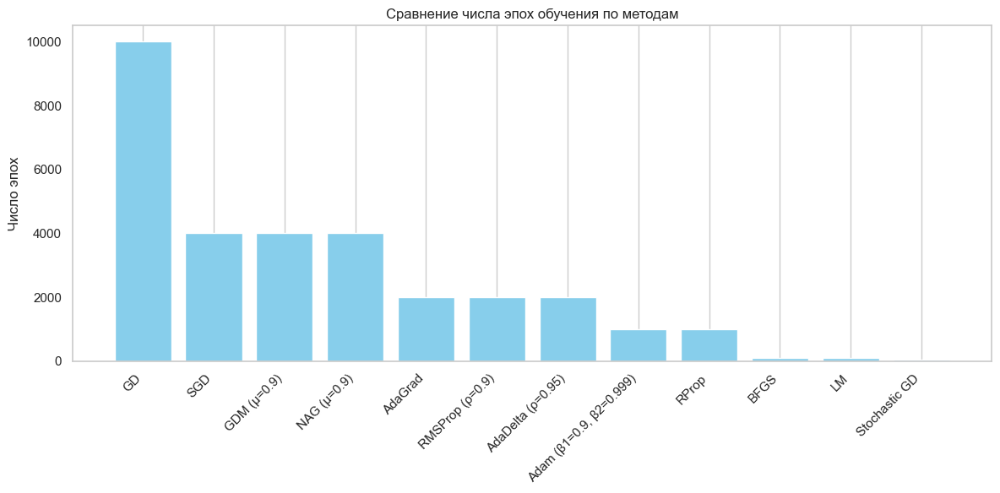

In [80]:
plt.figure(figsize=(12, 6))
plt.bar(epochs_dict.keys(), epochs_dict.values(), color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel("Число эпох")
plt.title("Сравнение числа эпох обучения по методам")
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [81]:
train_errors = {
    'GD': 0.141,
    'SGD': 0.312,
    'GDM (μ=0.9)': 0.192,
    'NAG (μ=0.9)': 0.192,
    'AdaGrad': 0.218,
    'RMSProp (ρ=0.9)': 0.145,
    'AdaDelta (ρ=0.95)': 0.169,
    'Adam (β1=0.9, β2=0.999)': 0.126,
    'RProp': 0.172,
    'BFGS': 0.251,
    'LM': 0.26,
    'Stochastic GD': 0.988,
}

test_errors = {
    'GD': 0.147,
    'SGD': 0.314,
    'GDM (μ=0.9)': 0.192,
    'NAG (μ=0.9)': 0.192,
    'AdaGrad': 0.225,
    'RMSProp (ρ=0.9)': 0.16,
    'AdaDelta (ρ=0.95)': 0.144,
    'Adam (β1=0.9, β2=0.999)': 0.15,
    'RProp': 0.181,
    'BFGS': 0.234,
    'LM': 0.256,
    'Stochastic GD': 1.041,
}


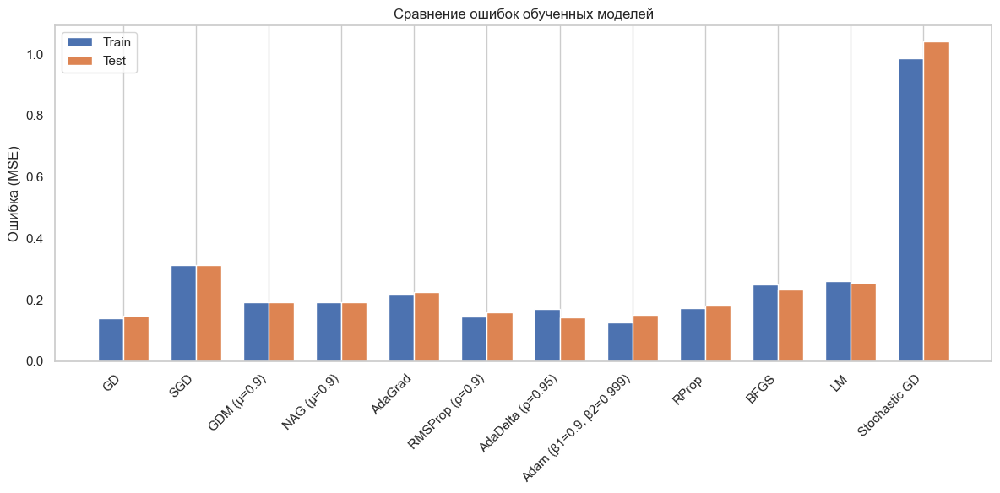

In [82]:
methods = list(train_errors.keys())
x = np.arange(len(methods))

train_vals = list(train_errors.values())
test_vals = list(test_errors.values())

width = 0.35

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, train_vals, width, label='Train')
plt.bar(x + width/2, test_vals, width, label='Test')
plt.xticks(x, methods, rotation=45, ha='right')
plt.ylabel("Ошибка (MSE)")
plt.title("Сравнение ошибок обученных моделей")
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [83]:
sigmas = np.linspace(0.01, 1.0, 20)
means_fc1, stds_fc1 = [], []
means_fc2, stds_fc2 = [], []

for sigma in sigmas:
    model = Net()
    with torch.no_grad():
        for param in model.parameters():
            if param.dim() > 1:
                nn.init.normal_(param, mean=0.0, std=sigma)
    
    outputs_fc1 = model.act(model.fc1(X_train_tensor))
    outputs_fc2 = model.act(model.fc2(outputs_fc1))
    
    means_fc1.append(outputs_fc1.mean().item())
    stds_fc1.append(outputs_fc1.std().item())
    means_fc2.append(outputs_fc2.mean().item())
    stds_fc2.append(outputs_fc2.std().item())


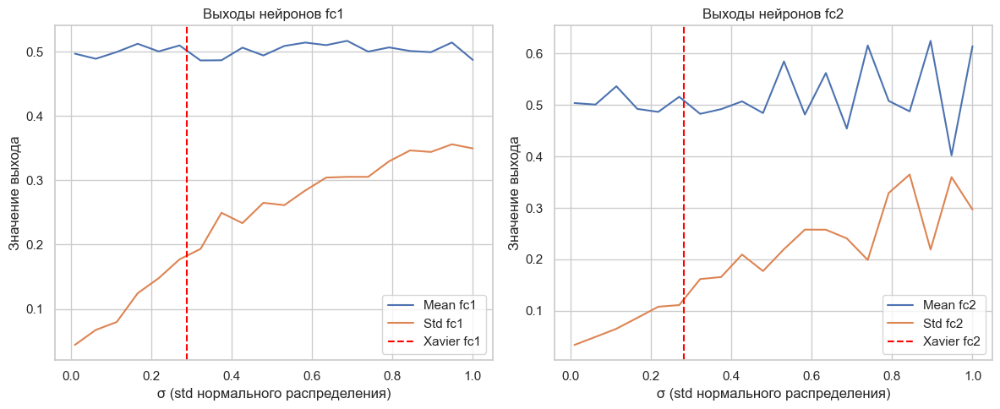

In [84]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(sigmas, means_fc1, label='Mean fc1')
plt.plot(sigmas, stds_fc1, label='Std fc1')
plt.axvline(x=np.sqrt(2/(9+15)), color='red', linestyle='--', label='Xavier fc1')
plt.legend()
plt.title("Выходы нейронов fc1")
plt.xlabel('σ (std нормального распределения)')
plt.ylabel('Значение выхода')


plt.subplot(1, 2, 2)
plt.plot(sigmas, means_fc2, label='Mean fc2')
plt.plot(sigmas, stds_fc2, label='Std fc2')
plt.axvline(x=np.sqrt(2/(15+10)), color='red', linestyle='--', label='Xavier fc2')
plt.legend()
plt.title("Выходы нейронов fc2")
plt.xlabel('σ (std нормального распределения)')
plt.ylabel('Значение выхода')
plt.tight_layout()
plt.show()


In [85]:
grad_means_fc1, grad_stds_fc1 = [], []
grad_means_fc2, grad_stds_fc2 = [], []

loss_fn = nn.MSELoss()

for sigma in sigmas:
    model = Net()
    with torch.no_grad():
        for param in model.parameters():
            if param.dim() > 1:
                nn.init.normal_(param, mean=0.0, std=sigma)
    
    model.train()
    model.zero_grad()

    outputs = model(X_train_tensor)
    loss = loss_fn(outputs, y_train_tensor)
    loss.backward()

    grad_fc1 = model.fc1.weight.grad
    grad_means_fc1.append(grad_fc1.mean().item())
    grad_stds_fc1.append(grad_fc1.std().item())

    grad_fc2 = model.fc2.weight.grad
    grad_means_fc2.append(grad_fc2.mean().item())
    grad_stds_fc2.append(grad_fc2.std().item())

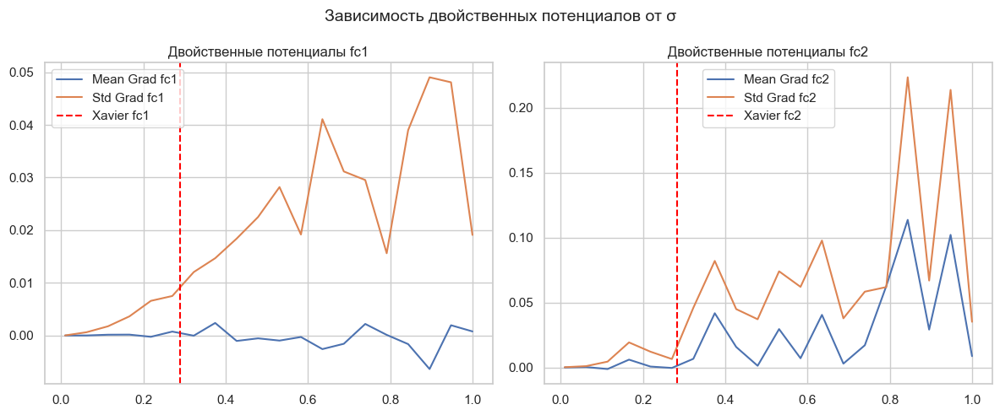

In [86]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(sigmas, grad_means_fc1, label='Mean Grad fc1')
plt.plot(sigmas, grad_stds_fc1, label='Std Grad fc1')
plt.axvline(x=np.sqrt(2/(9+15)), color='red', linestyle='--', label='Xavier fc1')
plt.legend()
plt.title("Двойственные потенциалы fc1")

plt.subplot(1, 2, 2)
plt.plot(sigmas, grad_means_fc2, label='Mean Grad fc2')
plt.plot(sigmas, grad_stds_fc2, label='Std Grad fc2')
plt.axvline(x=np.sqrt(2/(15+10)), color='red', linestyle='--', label='Xavier fc2')
plt.legend()
plt.title("Двойственные потенциалы fc2")

plt.suptitle("Зависимость двойственных потенциалов от σ", fontsize=14)
plt.tight_layout()
plt.show()


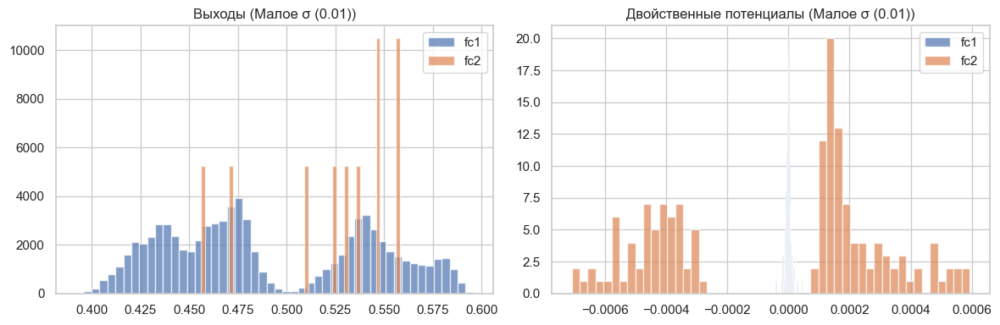

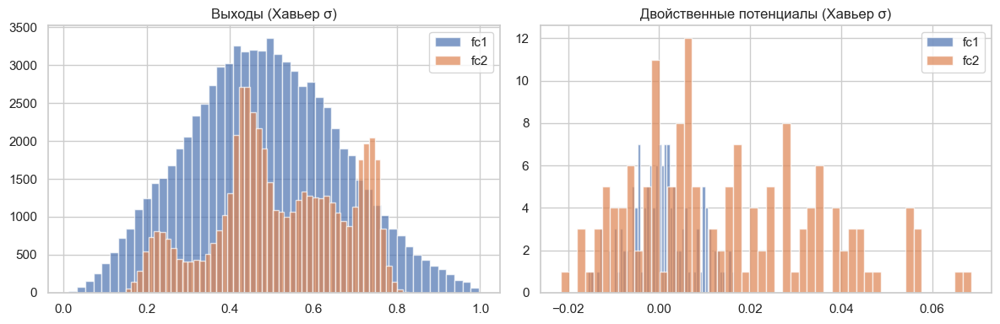

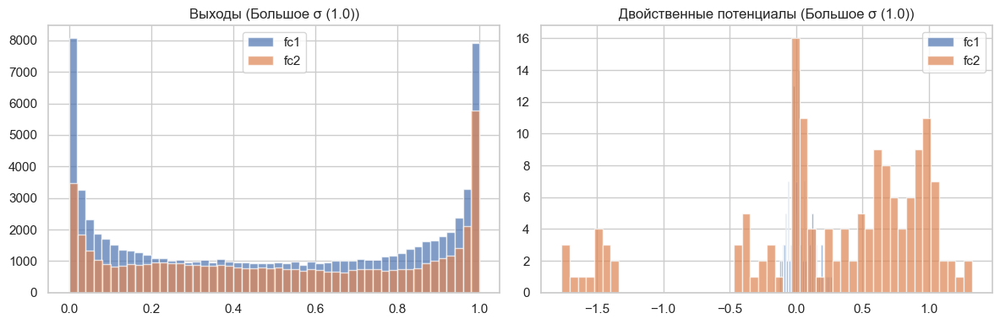

In [87]:
sigmas_to_test = {
    'Малое σ (0.01)': 0.01,
    'Хавьер σ': np.sqrt(2 / (9 + 15)),
    'Большое σ (1.0)': 1.0
}

loss_fn = nn.MSELoss()

for name, sigma in sigmas_to_test.items():
    model = Net()
    
    with torch.no_grad():
        for param in model.parameters():
            if param.dim() > 1:
                nn.init.normal_(param, mean=0.0, std=sigma)

    model.train()
    model.zero_grad()

    # Прямой проход
    outputs_fc1 = model.act(model.fc1(X_train_tensor))
    outputs_fc2 = model.act(model.fc2(outputs_fc1))
    outputs_final = model(X_train_tensor)

    # Обратный проход
    loss = loss_fn(outputs_final, y_train_tensor)
    loss.backward()

    grads_fc1 = model.fc1.weight.grad.flatten().detach().numpy()
    grads_fc2 = model.fc2.weight.grad.flatten().detach().numpy()
    outputs_fc1_np = outputs_fc1.flatten().detach().numpy()
    outputs_fc2_np = outputs_fc2.flatten().detach().numpy()

    # Гистограммы выходов
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.hist(outputs_fc1_np, bins=50, alpha=0.7, label='fc1')
    plt.hist(outputs_fc2_np, bins=50, alpha=0.7, label='fc2')
    plt.title(f'Выходы ({name})')
    plt.legend()

    # Гистограммы градиентов
    plt.subplot(1, 2, 2)
    plt.hist(grads_fc1, bins=50, alpha=0.7, label='fc1')
    plt.hist(grads_fc2, bins=50, alpha=0.7, label='fc2')
    plt.title(f'Двойственные потенциалы ({name})')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [88]:
sigmas_to_test = {
    'Малое σ (0.01)': 0.01,
    'Хавьер σ': np.sqrt(2 / (9 + 15)),  # например, для fc1
    'Большое σ (1.0)': 1.0
}

lr = 0.01
epochs = 50
loss_fn = nn.MSELoss()
results = {}

for name, sigma in sigmas_to_test.items():
    model = Net()
    with torch.no_grad():
        for param in model.parameters():
            if param.dim() > 1:
                nn.init.normal_(param, mean=0.0, std=sigma)
    
    optimizer = torch.optim.SGD(model.parameters(), lr=lr)
    train_losses = []
    test_losses = []

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        output = model(X_train_tensor)
        loss = loss_fn(output, y_train_tensor)
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

        model.eval()
        with torch.no_grad():
            test_output = model(X_test_tensor)
            test_loss = loss_fn(test_output, y_test_tensor).item()
            test_losses.append(test_loss)

    results[name] = {'train': train_losses, 'test': test_losses}


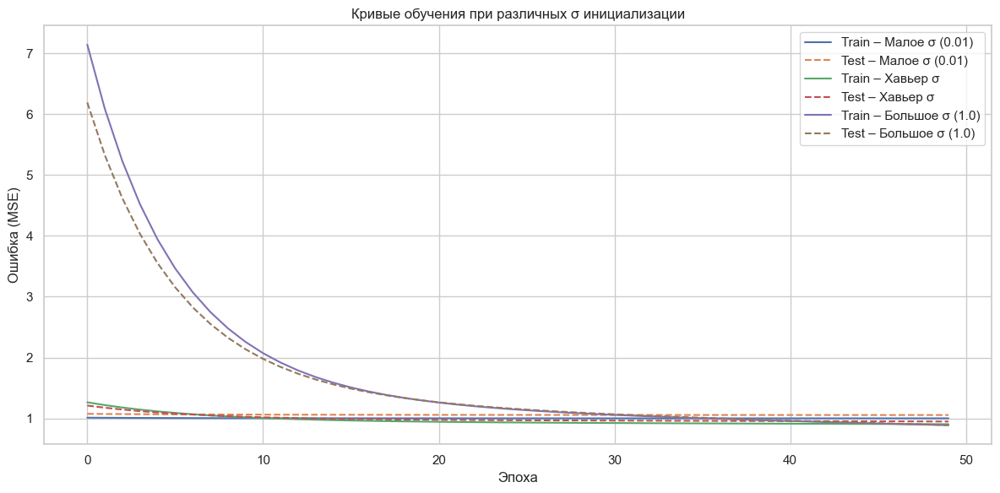

In [89]:
plt.figure(figsize=(12, 6))
for name in results:
    plt.plot(results[name]['train'], label=f'Train – {name}')
    plt.plot(results[name]['test'], linestyle='--', label=f'Test – {name}')

plt.xlabel('Эпоха')
plt.ylabel('Ошибка (MSE)')
plt.title('Кривые обучения при различных σ инициализации')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [90]:
def evaluate_init(init_fn, sigma, runs=10):
    train_errors, test_errors = [], []

    for _ in range(runs):
        model = Net()
        with torch.no_grad():
            for param in model.parameters():
                if param.dim() > 1:
                    init_fn(param, a=-sigma, b=sigma) if init_fn == nn.init.uniform_ else \
                    nn.init.normal_(param, mean=0.0, std=sigma)
        
        optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
        for epoch in range(50):
            model.train()
            optimizer.zero_grad()
            out = model(X_train_tensor)
            loss = nn.MSELoss()(out, y_train_tensor)
            loss.backward()
            optimizer.step()

        model.eval()
        with torch.no_grad():
            train_pred = model(X_train_tensor)
            test_pred = model(X_test_tensor)
            train_errors.append(nn.MSELoss()(train_pred, y_train_tensor).item())
            test_errors.append(nn.MSELoss()(test_pred, y_test_tensor).item())

    return np.mean(train_errors), np.std(train_errors), np.mean(test_errors), np.std(test_errors)


In [91]:
a = evaluate_init(nn.init.normal_, sigma=0.01)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')

1.00003±2e-05
1.05421±0.0006


In [92]:
a = evaluate_init(nn.init.uniform_, sigma=0.01)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')


1.00002±2e-05
1.05413±0.00051


In [93]:
def truncated_normal_(tensor, mean=0.0, std=1.0):
    with torch.no_grad():
        return tensor.normal_(mean, std).clamp_(-2*std, 2*std)

# Использование:
a = evaluate_init(truncated_normal_, sigma=0.01)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')


1.00001±1e-05
1.05413±0.00038


In [94]:
sigma_xavier_fc1 = np.sqrt(2 / (9 + 15))


In [95]:
sigma_xavier_fc1

np.float64(0.28867513459481287)

In [96]:
a = evaluate_init(nn.init.normal_, sigma=sigma_xavier_fc1)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')

0.97379±0.03068
1.02797±0.03609


In [97]:
a = evaluate_init(nn.init.uniform_, sigma=sigma_xavier_fc1)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')

0.99388±0.00837
1.04842±0.00833


In [98]:
a = evaluate_init(truncated_normal_, sigma=sigma_xavier_fc1)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')

0.96997±0.06252
1.02323±0.06399


In [99]:
a = evaluate_init(nn.init.normal_, sigma=1)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')

0.99755±0.2935
1.03901±0.30325


In [100]:
a = evaluate_init(nn.init.uniform_, sigma=1)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')

0.85889±0.08563
0.89874±0.0883


In [101]:
a = evaluate_init(truncated_normal_, sigma=1)
a = [round(i, 5) for i in a]
print(f'{a[0]}±{a[1]}')
print(f'{a[2]}±{a[3]}')

0.9323±0.19185
0.97401±0.20998


In [102]:
import copy

model = Net()
for param in model.parameters():
    if param.dim() > 1:
        nn.init.xavier_uniform_(param)

initial_state = copy.deepcopy(model.state_dict())


In [103]:
from sklearn.model_selection import train_test_split

n_runs = 10
train_errors_final = []
val_errors_final = []
test_errors_final = []

for i in range(n_runs):
    X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.3, random_state=None)
    
    X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.00000001, random_state=None)

    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).unsqueeze(1)

    X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.float32).unsqueeze(1)

    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).unsqueeze(1)
    
    # Обучение модели
    train_errors, val_errors, test_errors = train_model(
        X_train_tensor, y_train_tensor,
        X_val_tensor, y_val_tensor,
        X_test_tensor, y_test_tensor,
        lr=0.2,
        momentum=0.9,
        use_nag=False,
        epochs=1000
    )
    
    # Сохраняем последние ошибки
    train_errors_final.append(train_errors[-1])
    val_errors_final.append(val_errors[-1])
    test_errors_final.append(test_errors[-1])


In [104]:
print(f"Train error: {np.mean(train_errors_final):.4f} ± {np.std(train_errors_final):.4f}")
print(f"Test error:  {np.mean(test_errors_final):.4f} ± {np.std(test_errors_final):.4f}")

Train error: 0.1378 ± 0.0000
Test error:  0.1493 ± 0.0000


In [105]:
model = Net()
for param in model.parameters():
    if param.dim() > 1:
        nn.init.xavier_uniform_(param)

initial_state = copy.deepcopy(model.state_dict())

n_runs = 10
train_errors_final = []
val_errors_final = []
test_errors_final = []

for i in range(n_runs):
    X_temp, X_train, y_temp, y_train = train_test_split(X, y, test_size=0.6, random_state=None)
    
    X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.75, random_state=None)

    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).unsqueeze(1)  # если y одномерный

    X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.float32).unsqueeze(1)

    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).unsqueeze(1)
    
    # Обучение модели
    train_errors, val_errors, test_errors = train_model(
        X_train_tensor, y_train_tensor,
        X_val_tensor, y_val_tensor,
        X_test_tensor, y_test_tensor,
        lr=0.2,
        momentum=0.9,
        use_nag=False,
        epochs=1000
    )
    
    # Сохраняем последние ошибки
    train_errors_final.append(train_errors[-1])
    val_errors_final.append(val_errors[-1])
    test_errors_final.append(test_errors[-1])


In [106]:
print(f"Train error: {np.mean(train_errors_final):.4f} ± {np.std(train_errors_final):.4f}")
print(f"Test error:  {np.mean(test_errors_final):.4f} ± {np.std(test_errors_final):.4f}")

Train error: 0.1366 ± 0.0000
Test error:  0.1381 ± 0.0000


In [107]:
def train_model(
    X_train,
    y_train,
    X_val,
    y_val,
    X_test,
    y_test,
    lr,
    momentum,
    use_nag=False,
    epochs=2000
):
    model = Net()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum, nesterov=use_nag)

    train_losses = []
    val_losses = []
    test_losses = []

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        output = model(X_train)
        loss = criterion(output, y_train)
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            test_loss = criterion(model(X_test), y_test).item()

            if X_val is not None and y_val is not None:
                val_loss = criterion(model(X_val), y_val).item()
            else:
                val_loss = None

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        test_losses.append(test_loss)

    return train_losses, val_losses, test_losses


In [108]:
X_train_tensor = torch.tensor(X_train_fold.values, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_fold.values, dtype=torch.float32).view(-1, 1)
X_test_tensor = torch.tensor(X_test_fold.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_fold.values, dtype=torch.float32).view(-1, 1)

train_losses, val_losses, test_losses = train_model(
    X_train=X_train_tensor,
    y_train=y_train_tensor,
    X_val=None,
    y_val=None,
    X_test=X_test_tensor,
    y_test=y_test_tensor,
    lr=0.2,
    momentum=0.9,
    use_nag=False,
    epochs=2000
)


NameError: name 'X_train_fold' is not defined

In [109]:
print(f"Train error: {np.mean(train_losses):.4f} ± {np.std(train_losses):.4f}")
print(f"Test error:  {np.mean(test_losses):.4f} ± {np.std(test_losses):.4f}")

Train error: 1.7548 ± 1.3841
Test error:  1.6680 ± 1.1800


In [110]:
from sklearn.model_selection import LeaveOneOut, train_test_split

loo = LeaveOneOut()
train_errors_final, test_errors_final = [], []

model = Net()
with torch.no_grad():
    for param in model.parameters():
        if param.dim() > 1:
            nn.init.trunc_normal_(param, std=0.1) 
initial_state = copy.deepcopy(model.state_dict())

for train_idx, test_idx in loo.split(X):
    model.load_state_dict(copy.deepcopy(initial_state))

    X_train_total, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train_total, y_test = y.iloc[train_idx], y.iloc[test_idx]

    X_train, X_val, y_train, y_val = train_test_split(X_train_total, y_train_total, test_size=0.3)

    to_tensor = lambda df: torch.tensor(df.values, dtype=torch.float32)
    X_train_tensor = to_tensor(X_train)
    y_train_tensor = to_tensor(y_train).view(-1, 1)
    X_val_tensor = to_tensor(X_val)
    y_val_tensor = to_tensor(y_val).view(-1, 1)
    X_test_tensor = to_tensor(X_test)
    y_test_tensor = to_tensor(y_test).view(-1, 1)

    train_losses, val_losses, test_losses = train_model(
        X_train_tensor, y_train_tensor,
        X_val_tensor, y_val_tensor,
        X_test_tensor, y_test_tensor,
        lr=0.2, momentum=0.9, epochs=1
    )

    train_errors_final.append(train_losses[-1])
    test_errors_final.append(test_losses[-1])

train_mean = np.mean(train_errors_final)
train_std = np.std(train_errors_final)
test_mean = np.mean(test_errors_final)
test_std = np.std(test_errors_final)

print(f"Средняя ошибка на обучающей выборке: {train_mean:.4f} ± {train_std:.5f}")
print(f"Средняя ошибка на тестовой выборке: {test_mean:.4f} ± {test_std:.5f}")


Средняя ошибка на обучающей выборке: 1.0245 ± 0.04434
Средняя ошибка на тестовой выборке: 1.0315 ± 1.66589


In [111]:
from sklearn.model_selection import KFold, train_test_split

k_values = list(range(2, 11))
train_means, train_stds = [], []
test_means, test_stds = [], []

model = Net()
with torch.no_grad():
    for param in model.parameters():
        if param.dim() > 1:
            nn.init.trunc_normal_(param, std=0.1)
initial_state = copy.deepcopy(model.state_dict())

for k in k_values:
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    train_errors, test_errors = [], []

    for train_idx, test_idx in kf.split(X):
        model.load_state_dict(copy.deepcopy(initial_state))

        X_train_all, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train_all, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Внутри тренировочного фолда выделяем валидацию
        X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, test_size=0.3)

        # В тензоры
        to_tensor = lambda df: torch.tensor(df.values, dtype=torch.float32)
        X_train_tensor = to_tensor(X_train)
        y_train_tensor = to_tensor(y_train).view(-1, 1)
        X_val_tensor = to_tensor(X_val)
        y_val_tensor = to_tensor(y_val).view(-1, 1)
        X_test_tensor = to_tensor(X_test)
        y_test_tensor = to_tensor(y_test).view(-1, 1)

        train_loss, val_loss, test_loss = train_model(
            X_train_tensor, y_train_tensor,
            X_val_tensor, y_val_tensor,
            X_test_tensor, y_test_tensor,
            lr=0.2, momentum=0.9,
            epochs=1000
        )

        train_errors.append(train_loss[-1])
        test_errors.append(test_loss[-1])

    train_means.append(np.mean(train_errors))
    train_stds.append(np.std(train_errors))
    test_means.append(np.mean(test_errors))
    test_stds.append(np.std(test_errors))


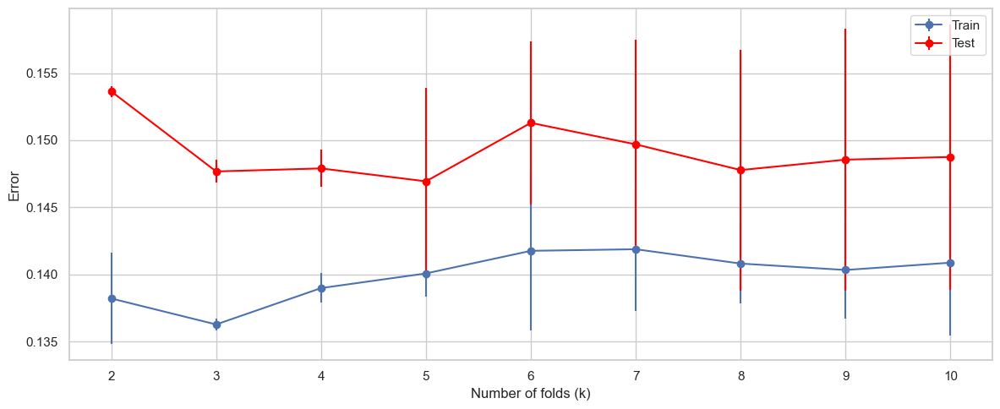

In [112]:
plt.figure(figsize=(12, 5))

plt.errorbar(k_values, train_means, yerr=train_stds, fmt='-o', label='Train')
plt.errorbar(k_values, test_means, yerr=test_stds, fmt='-o', color='red', label='Test')
plt.xlabel('Number of folds (k)')
plt.ylabel('Error')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [113]:
hidden_sizes = [2, 4, 8, 16, 32, 64]

train_means, train_stds = [], []
test_means, test_stds = [], []

# Сеть с параметром числа нейронов
class Net(nn.Module):
    def __init__(self, input_dim, hidden_dim, activation_fn):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            activation_fn,
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):
        return self.net(x)

# Используем логистическую функцию или другую
activation_fn = nn.Tanh() 

for hidden_size in hidden_sizes:
    train_errors, test_errors = [], []

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    for train_idx, test_idx in kf.split(X):
        X_train_all, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train_all, y_test = y.iloc[train_idx], y.iloc[test_idx]

        X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, test_size=0.3)

        to_tensor = lambda x: torch.tensor(x.values, dtype=torch.float32)
        X_train_tensor = to_tensor(X_train)
        y_train_tensor = to_tensor(y_train).view(-1, 1)
        X_val_tensor = to_tensor(X_val)
        y_val_tensor = to_tensor(y_val).view(-1, 1)
        X_test_tensor = to_tensor(X_test)
        y_test_tensor = to_tensor(y_test).view(-1, 1)

        model = Net(X.shape[1], hidden_size, activation_fn)
        criterion = nn.MSELoss()

        optimizer = torch.optim.LBFGS(model.parameters(), lr=1.0)

        def closure():
            optimizer.zero_grad()
            output = model(X_train_tensor)
            loss = criterion(output, y_train_tensor)
            loss.backward()
            return loss

        for _ in range(20):
            optimizer.step(closure)

        with torch.no_grad():
            train_loss = criterion(model(X_train_tensor), y_train_tensor).item()
            test_loss = criterion(model(X_test_tensor), y_test_tensor).item()

        train_errors.append(train_loss)
        test_errors.append(test_loss)

    train_means.append(np.mean(train_errors))
    train_stds.append(np.std(train_errors))
    test_means.append(np.mean(test_errors))
    test_stds.append(np.std(test_errors))


In [114]:
for i in range(len(hidden_sizes)):
    print(f'{train_means[i-2]:.4f} ± {train_stds[i-2]:.4f}')

0.0997 ± 0.0033
0.0863 ± 0.0024
0.2175 ± 0.0040
0.1677 ± 0.0016
0.1395 ± 0.0026
0.1175 ± 0.0026


In [115]:
for i in range(len(hidden_sizes)):
    print(f'{test_means[i-2]:.4f} ± {test_stds[i-2]:.4f}')

0.1266 ± 0.0119
0.1248 ± 0.0109
0.2191 ± 0.0128
0.1742 ± 0.0126
0.1466 ± 0.0138
0.1362 ± 0.0126


In [116]:
activation_functions = {
    'logistic': nn.Sigmoid(),
    'tanh': nn.Tanh(),
    'linear': nn.Identity(),
    'softsign': nn.Softsign(),
    'softplus': nn.Softplus()
}


In [117]:
hidden_size = 4
train_means, train_stds = [], []
test_means, test_stds = [], []

# Сеть с параметром числа нейронов
class Net(nn.Module):
    def __init__(self, input_dim, hidden_dim, activation_fn):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            activation_fn,
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):
        return self.net(x)

for name, activation_fn in activation_functions.items():  # <-- исправлено
    train_errors, test_errors = [], []

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    for train_idx, test_idx in kf.split(X):
        X_train_all, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train_all, y_test = y.iloc[train_idx], y.iloc[test_idx]

        X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, test_size=0.3)

        to_tensor = lambda x: torch.tensor(x.values, dtype=torch.float32)
        X_train_tensor = to_tensor(X_train)
        y_train_tensor = to_tensor(y_train).view(-1, 1)
        X_val_tensor = to_tensor(X_val)
        y_val_tensor = to_tensor(y_val).view(-1, 1)
        X_test_tensor = to_tensor(X_test)
        y_test_tensor = to_tensor(y_test).view(-1, 1)

        model = Net(X.shape[1], hidden_size, activation_fn)  # <-- теперь activation_fn — это модуль
        criterion = nn.MSELoss()
        optimizer = torch.optim.LBFGS(model.parameters(), lr=1.0)

        def closure():
            optimizer.zero_grad()
            output = model(X_train_tensor)
            loss = criterion(output, y_train_tensor)
            loss.backward()
            return loss

        for _ in range(20):
            optimizer.step(closure)

        with torch.no_grad():
            train_loss = criterion(model(X_train_tensor), y_train_tensor).item()
            test_loss = criterion(model(X_test_tensor), y_test_tensor).item()

        train_errors.append(train_loss)
        test_errors.append(test_loss)

    train_means.append(np.mean(train_errors))
    train_stds.append(np.std(train_errors))
    test_means.append(np.mean(test_errors))
    test_stds.append(np.std(test_errors))

    print(f"{name:10s} | Train: {train_means[-1]:.4f} ± {train_stds[-1]:.4f} | "
          f"Test: {test_means[-1]:.4f} ± {test_stds[-1]:.4f}")


logistic   | Train: 0.1676 ± 0.0049 | Test: 0.1717 ± 0.0123
tanh       | Train: 0.2097 ± 0.1302 | Test: 0.2140 ± 0.1255
linear     | Train: 0.3015 ± 0.0050 | Test: 0.3021 ± 0.0147
softsign   | Train: 0.1695 ± 0.0093 | Test: 0.1773 ± 0.0151
softplus   | Train: 0.1646 ± 0.0039 | Test: 0.1692 ± 0.0131


In [120]:
# ==== Настройки ====
best_hidden_size = 4
best_activation_fn = nn.Tanh()
lambdas = [0.0, 0.001, 0.01, 0.1, 1.0, 10.0]

# ==== Сеть ====
class Net(nn.Module):
    def __init__(self, input_dim, hidden_dim, activation_fn):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            activation_fn,
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):
        return self.net(x)

# ==== Преобразование данных ====
to_tensor = lambda x: torch.tensor(x.values, dtype=torch.float32)

In [121]:
# ==== Основной цикл ====
def regularization_experiment(X, y):
    results = {}
    for reg_type in ['l1', 'l2']:
        print(f"Регуляризация: {reg_type}")
        train_stats, test_stats, weight_norms = [], [], []

        for lam in lambdas:
            train_errors, test_errors = [], []
            norms = []
            
            kf = KFold(n_splits=10, shuffle=True, random_state=42)
            for train_idx, test_idx in kf.split(X):
                X_train_all, X_test = X.iloc[train_idx], X.iloc[test_idx]
                y_train_all, y_test = y.iloc[train_idx], y.iloc[test_idx]
                X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, test_size=0.3)

                X_train_tensor = to_tensor(X_train)
                y_train_tensor = to_tensor(y_train).view(-1, 1)
                X_test_tensor = to_tensor(X_test)
                y_test_tensor = to_tensor(y_test).view(-1, 1)

                model = Net(X.shape[1], best_hidden_size, best_activation_fn)
                optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
                criterion = nn.MSELoss()

                for _ in range(200):
                    model.train()
                    optimizer.zero_grad()
                    output = model(X_train_tensor)
                    loss = criterion(output, y_train_tensor)

                    reg_term = 0
                    for p in model.parameters():
                        if reg_type == 'l1':
                            reg_term += torch.sum(torch.abs(p))
                        elif reg_type == 'l2':
                            reg_term += torch.sum(p ** 2)
                    loss += lam * reg_term
                    loss.backward()
                    optimizer.step()

                with torch.no_grad():
                    train_loss = criterion(model(X_train_tensor), y_train_tensor).item()
                    test_loss = criterion(model(X_test_tensor), y_test_tensor).item()

                    all_weights = torch.cat([p.view(-1) for p in model.parameters()])
                    norm = torch.norm(all_weights, p=1 if reg_type == 'l1' else 2).item()

                train_errors.append(train_loss)
                test_errors.append(test_loss)
                norms.append(norm)

            train_stats.append((np.mean(train_errors), np.std(train_errors)))
            test_stats.append((np.mean(test_errors), np.std(test_errors)))
            weight_norms.append(np.mean(norms))

        results[reg_type] = {
            'train': train_stats,
            'test': test_stats,
            'norms': weight_norms
        }
    return results

In [122]:
# ==== Графики ====
def plot_errors(lambdas, stats, reg_type):
    train_mean, train_std = zip(*stats['train'])
    test_mean, test_std = zip(*stats['test'])

    plt.errorbar(lambdas, train_mean, yerr=train_std, label='Train', fmt='-o')
    plt.errorbar(lambdas, test_mean, yerr=test_std, label='Test', fmt='-s')
    plt.xscale('log')
    plt.title(f'Ошибка vs lambda ({reg_type})')
    plt.xlabel('Lambda')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)
    plt.show()

In [123]:
def plot_norms(lambdas, norms, reg_type):
    plt.plot(lambdas, norms, '-o')
    plt.xscale('log')
    plt.title(f'Норма весов vs lambda ({reg_type})')
    plt.xlabel('Lambda')
    plt.ylabel(f'{reg_type.upper()} норма')
    plt.grid(True)
    plt.show()

In [124]:
results = regularization_experiment(X, y)

Регуляризация: l1
Регуляризация: l2


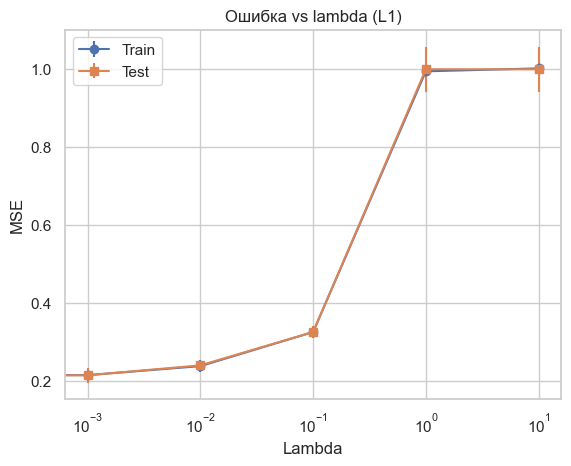

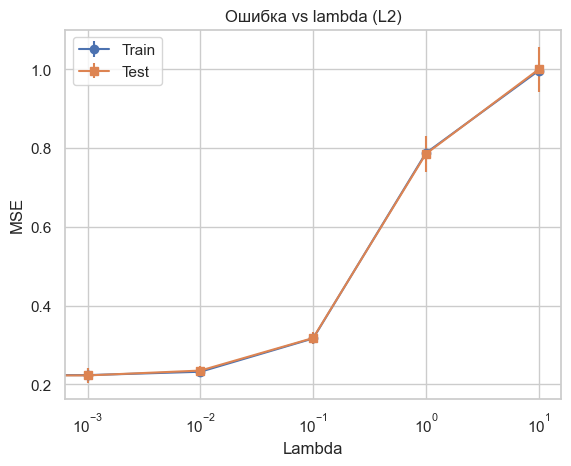

In [125]:
plot_errors(lambdas, results['l1'], 'L1')
plot_errors(lambdas, results['l2'], 'L2')

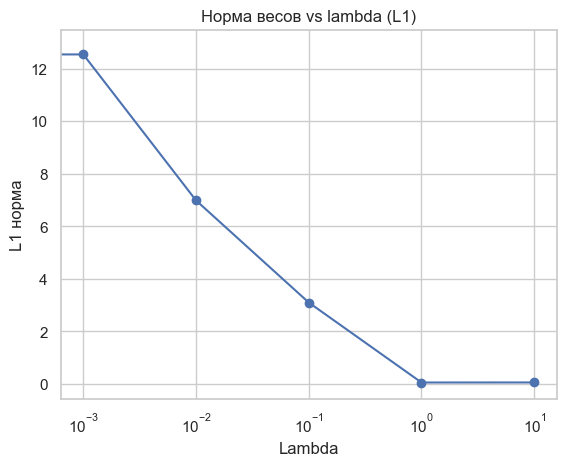

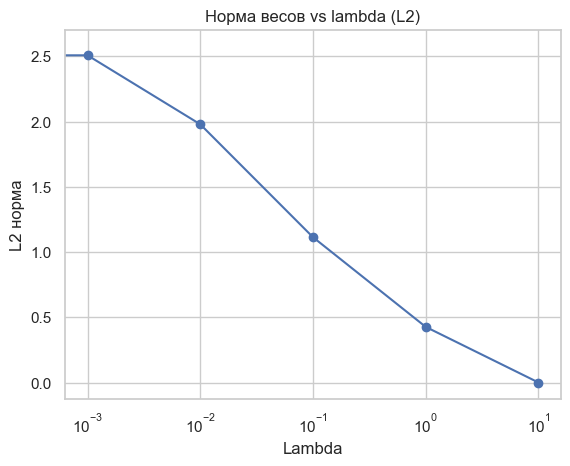

In [126]:
plot_norms(lambdas, results['l1']['norms'], 'L1')
plot_norms(lambdas, results['l2']['norms'], 'L2')

In [127]:
def plot_norms_l1_l2(model_class, X_train, y_train, lambdas):
    l1_norms_l1 = []
    l2_norms_l1 = []
    l1_norms_l2 = []
    l2_norms_l2 = []

    to_tensor = lambda x: torch.tensor(x.values, dtype=torch.float32)
    X_tensor = to_tensor(X_train)
    y_tensor = to_tensor(y_train).view(-1, 1)

    for lam in lambdas:
        # --- L1 регуляризация ---
        model_l1 = model_class()
        optimizer_l1 = torch.optim.Adam(model_l1.parameters(), lr=0.01)

        for _ in range(100):
            optimizer_l1.zero_grad()
            output = model_l1(X_tensor)
            mse = nn.MSELoss()(output, y_tensor)
            l1_reg = sum(torch.sum(torch.abs(param)) for param in model_l1.parameters())
            loss = mse + lam * l1_reg
            loss.backward()
            optimizer_l1.step()

        with torch.no_grad():
            l1 = sum(torch.sum(torch.abs(p)).item() for p in model_l1.parameters())
            l2 = sum(torch.sum(p ** 2).item() for p in model_l1.parameters())
            l1_norms_l1.append(l1)
            l2_norms_l1.append(np.sqrt(l2))

        # --- L2 регуляризация ---
        model_l2 = model_class()
        optimizer_l2 = torch.optim.Adam(model_l2.parameters(), lr=0.01)

        for _ in range(100):
            optimizer_l2.zero_grad()
            output = model_l2(X_tensor)
            mse = nn.MSELoss()(output, y_tensor)
            l2_reg = sum(torch.sum(p ** 2) for p in model_l2.parameters())
            loss = mse + lam * l2_reg
            loss.backward()
            optimizer_l2.step()

        with torch.no_grad():
            l1 = sum(torch.sum(torch.abs(p)).item() for p in model_l2.parameters())
            l2 = sum(torch.sum(p ** 2).item() for p in model_l2.parameters())
            l1_norms_l2.append(l1)
            l2_norms_l2.append(np.sqrt(l2))

    # --- Построение графиков ---
    plt.figure(figsize=(12, 10))

    plt.subplot(2, 2, 1)
    plt.plot(lambdas, l1_norms_l1, marker='o')
    plt.title('L1-норма при L1-регуляризации')
    plt.xlabel('λ')
    plt.ylabel('L1-норма')

    plt.subplot(2, 2, 2)
    plt.plot(lambdas, l2_norms_l1, marker='o')
    plt.title('L2-норма при L1-регуляризации')
    plt.xlabel('λ')
    plt.ylabel('L2-норма')

    plt.subplot(2, 2, 3)
    plt.plot(lambdas, l1_norms_l2, marker='o')
    plt.title('L1-норма при L2-регуляризации')
    plt.xlabel('λ')
    plt.ylabel('L1-норма')

    plt.subplot(2, 2, 4)
    plt.plot(lambdas, l2_norms_l2, marker='o')
    plt.title('L2-норма при L2-регуляризации')
    plt.xlabel('λ')
    plt.ylabel('L2-норма')

    plt.tight_layout()
    plt.show()

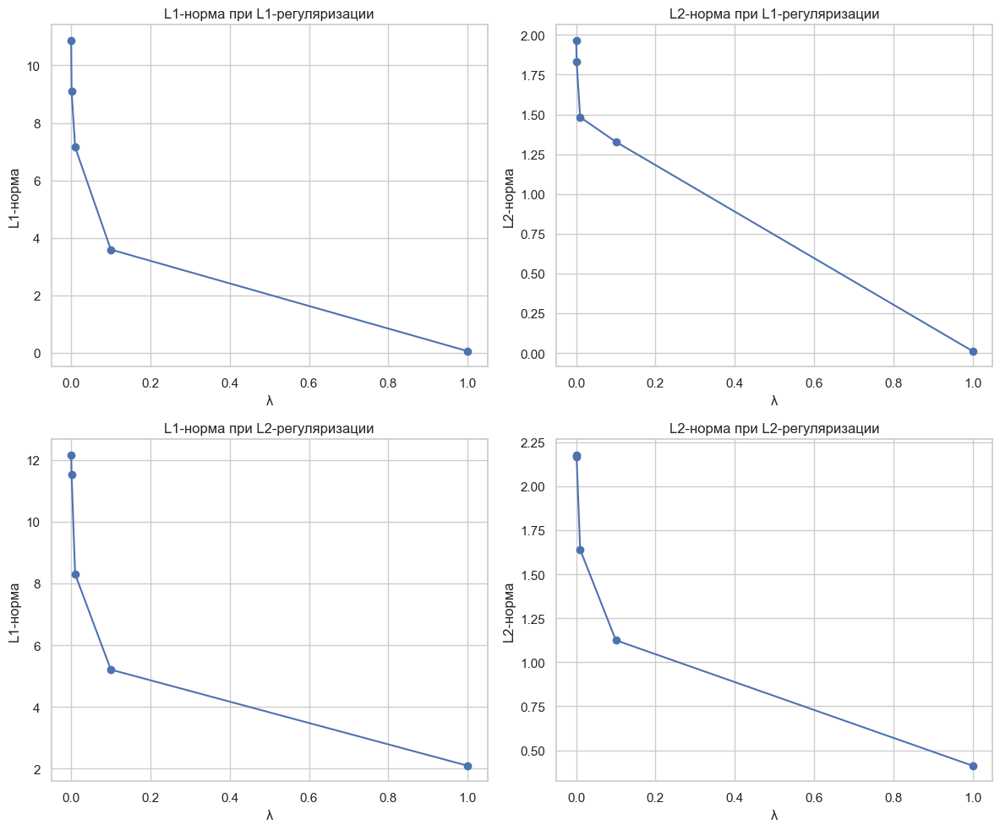

In [128]:
lambdas = [0.0, 0.001, 0.01, 0.1, 1.0]
plot_norms_l1_l2(lambda: Net(X.shape[1], best_hidden_size, best_activation_fn), X_train, y_train, lambdas)


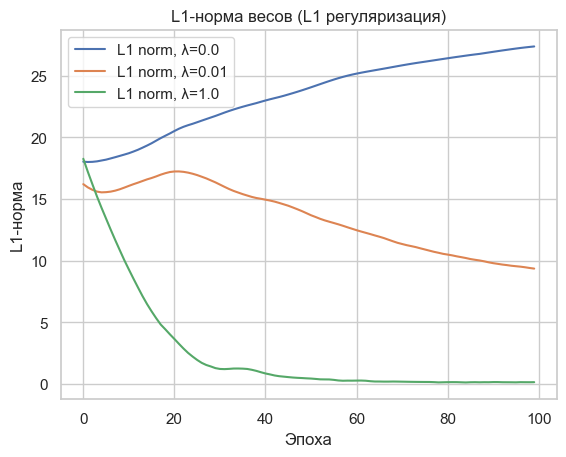

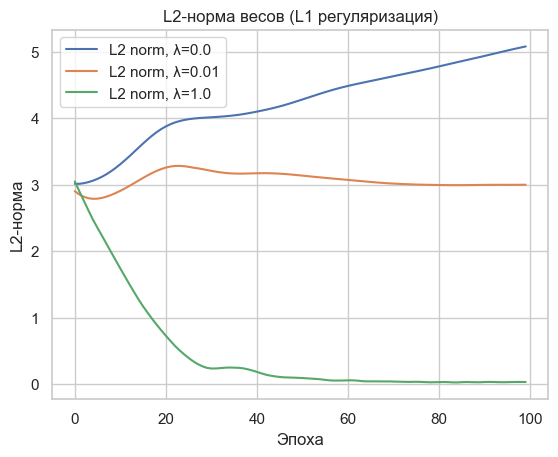

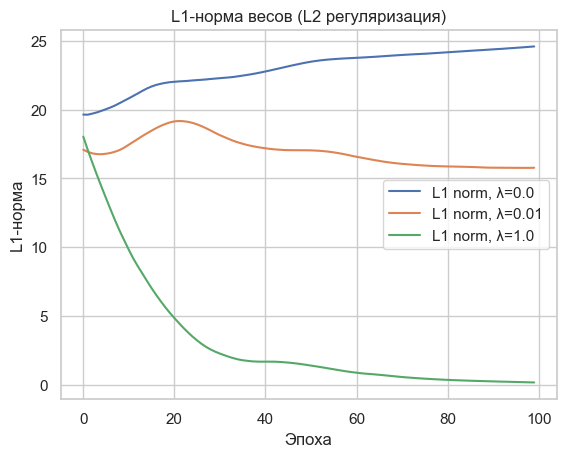

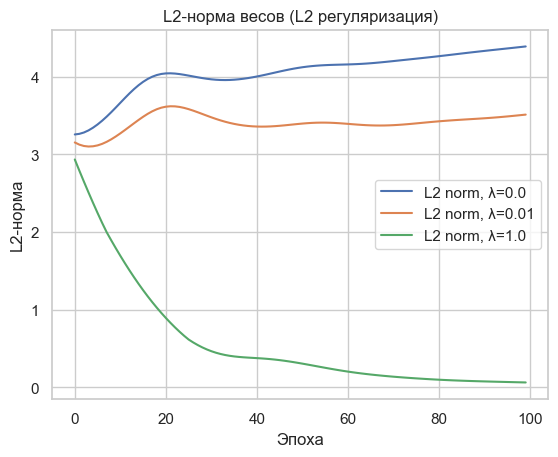

In [129]:
lambdas = [0.0, 0.01, 1.0]
epochs = 100
input_dim = X_train.shape[1]
hidden_size = 10

# === Архитектура сети ===
class Net(nn.Module):
    def __init__(self, input_dim, hidden_dim, activation_fn):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            activation_fn,
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):
        return self.net(x)

# === Подготовка данных ===
to_tensor = lambda x: torch.tensor(x.values, dtype=torch.float32)
X_tensor = to_tensor(X_train)
y_tensor = to_tensor(y_train).view(-1, 1)

# === Основная функция сравнения кривых норм ===
def track_norms(reg_type='l2'):
    all_norms = {}

    for lam in lambdas:
        model = Net(input_dim, hidden_size, nn.ReLU())
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
        criterion = nn.MSELoss()
        norms = []

        for _ in range(epochs):
            model.train()
            optimizer.zero_grad()

            output = model(X_tensor)
            loss = criterion(output, y_tensor)

            # Добавляем регуляризацию
            if reg_type == 'l1':
                l1_reg = sum(torch.sum(torch.abs(param)) for param in model.parameters())
                loss += lam * l1_reg
            elif reg_type == 'l2':
                l2_reg = sum(torch.sum(param ** 2) for param in model.parameters())
                loss += lam * l2_reg

            loss.backward()
            optimizer.step()

            # Сохраняем нормы весов после каждой эпохи
            with torch.no_grad():
                l1 = sum(torch.sum(torch.abs(p)).item() for p in model.parameters())
                l2 = sum(torch.sum(p ** 2).sqrt().item() for p in model.parameters())
                norms.append((l1, l2))

        all_norms[lam] = norms

    return all_norms

# === Построение графиков ===
def plot_training_norms(all_norms, reg_type='l2'):
    for lam, norms in all_norms.items():
        l1_vals = [n[0] for n in norms]
        l2_vals = [n[1] for n in norms]

        plt.plot(l1_vals, label=f"L1 norm, λ={lam}")
    plt.title(f'L1-норма весов ({reg_type.upper()} регуляризация)')
    plt.xlabel("Эпоха")
    plt.ylabel("L1-норма")
    plt.legend()
    plt.grid(True)
    plt.show()

    for lam, norms in all_norms.items():
        l2_vals = [n[1] for n in norms]
        plt.plot(l2_vals, label=f"L2 norm, λ={lam}")
    plt.title(f'L2-норма весов ({reg_type.upper()} регуляризация)')
    plt.xlabel("Эпоха")
    plt.ylabel("L2-норма")
    plt.legend()
    plt.grid(True)
    plt.show()

# === Запуск для L1 регуляризации ===
norms_l1 = track_norms(reg_type='l1')
plot_training_norms(norms_l1, reg_type='l1')

# === Запуск для L2 регуляризации ===
norms_l2 = track_norms(reg_type='l2')
plot_training_norms(norms_l2, reg_type='l2')

In [130]:
def train_with_noise(X_train, y_train, X_val, y_val, model, optimizer, criterion,
                     epochs=100, noise_std_input=0.0, noise_std_grad=0.0):

    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()

        # Добавляем шум к входам
        if noise_std_input > 0:
            noise_input = torch.randn_like(X_train) * noise_std_input
            noisy_input = X_train + noise_input
        else:
            noisy_input = X_train

        output = model(noisy_input)
        loss = criterion(output, y_train)

        loss.backward()

        # Добавляем шум к градиентам
        if noise_std_grad > 0:
            for param in model.parameters():
                if param.grad is not None:
                    noise_grad = torch.randn_like(param.grad) * noise_std_grad
                    param.grad += noise_grad

        optimizer.step()

        # Записываем ошибки на обучающей и валидационной выборках
        model.eval()
        with torch.no_grad():
            train_loss = criterion(model(X_train), y_train).item()
            val_loss = criterion(model(X_val), y_val).item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)

    return train_losses, val_losses


In [131]:
def study_noise_effect(X_train_all, y_train_all, input_dim, hidden_size,
                       noise_type='input', noise_levels=None, epochs=100):

    if noise_levels is None:
        noise_levels = [0.0, 0.01, 0.05, 0.1, 0.2]

    train_means, train_stds = [], []
    val_means, val_stds = [], []

    for noise_std in noise_levels:
        train_errors, val_errors = [], []

        # 10-fold CV или просто разделение 70/30 внутри обучающей части
        for _ in range(5):  # 5 повторов для оценки ошибки

            X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, test_size=0.3)

            to_tensor = lambda x: torch.tensor(x.values, dtype=torch.float32)
            X_train_tensor = to_tensor(X_train)
            y_train_tensor = to_tensor(y_train).view(-1, 1)
            X_val_tensor = to_tensor(X_val)
            y_val_tensor = to_tensor(y_val).view(-1, 1)

            model = Net(input_dim, hidden_size, nn.ReLU())
            criterion = nn.MSELoss()
            optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

            if noise_type == 'input':
                train_loss, val_loss = train_with_noise(
                    X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor,
                    model, optimizer, criterion, epochs=epochs,
                    noise_std_input=noise_std, noise_std_grad=0.0
                )
            elif noise_type == 'grad':
                train_loss, val_loss = train_with_noise(
                    X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor,
                    model, optimizer, criterion, epochs=epochs,
                    noise_std_input=0.0, noise_std_grad=noise_std
                )
            else:
                raise ValueError("noise_type должен быть 'input' или 'grad'")

            train_errors.append(train_loss[-1])
            val_errors.append(val_loss[-1])

        train_means.append(np.mean(train_errors))
        train_stds.append(np.std(train_errors))
        val_means.append(np.mean(val_errors))
        val_stds.append(np.std(val_errors))

    return noise_levels, train_means, train_stds, val_means, val_stds


In [132]:
def plot_noise_effect(noise_levels, train_means, train_stds, val_means, val_stds, noise_type):
    plt.errorbar(noise_levels, train_means, yerr=train_stds, label='Train Error', fmt='-o')
    plt.errorbar(noise_levels, val_means, yerr=val_stds, label='Validation Error', fmt='-s')
    plt.xlabel(f'σ шума ({noise_type})')
    plt.ylabel('Ошибка MSE')
    plt.title(f'Влияние шума {noise_type} на качество сети')
    plt.legend()
    plt.grid(True)
    plt.show()


In [133]:
def plot_training_curves_comparison(X_train, y_train, X_val, y_val, input_dim, hidden_size,
                                   noise_std, epochs=100):

    to_tensor = lambda x: torch.tensor(x.values, dtype=torch.float32)
    X_train_tensor = to_tensor(X_train)
    y_train_tensor = to_tensor(y_train).view(-1, 1)
    X_val_tensor = to_tensor(X_val)
    y_val_tensor = to_tensor(y_val).view(-1, 1)

    scenarios = {
        'Без шума': {'noise_std_input': 0.0, 'noise_std_grad': 0.0},
        'Шум входов': {'noise_std_input': noise_std, 'noise_std_grad': 0.0},
        'Шум градиентов': {'noise_std_input': 0.0, 'noise_std_grad': noise_std},
        'Шум входов и градиентов': {'noise_std_input': noise_std, 'noise_std_grad': noise_std},
    }

    plt.figure(figsize=(12, 8))

    for name, params in scenarios.items():
        model = Net(input_dim, hidden_size, nn.ReLU())
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

        train_losses, val_losses = train_with_noise(
            X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor,
            model, optimizer, criterion,
            epochs=epochs,
            noise_std_input=params['noise_std_input'],
            noise_std_grad=params['noise_std_grad']
        )

        plt.plot(train_losses, label=f'{name} - train')
        plt.plot(val_losses, label=f'{name} - val')

    plt.xlabel('Эпоха')
    plt.ylabel('Ошибка MSE')
    plt.title('Кривые обучения с разными видами шума')
    plt.legend()
    plt.grid(True)
    plt.show()


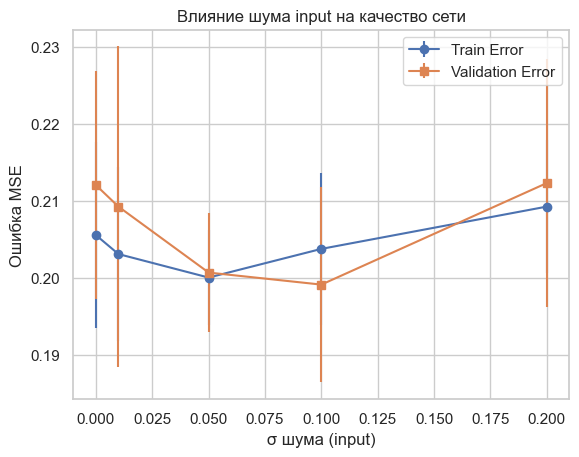

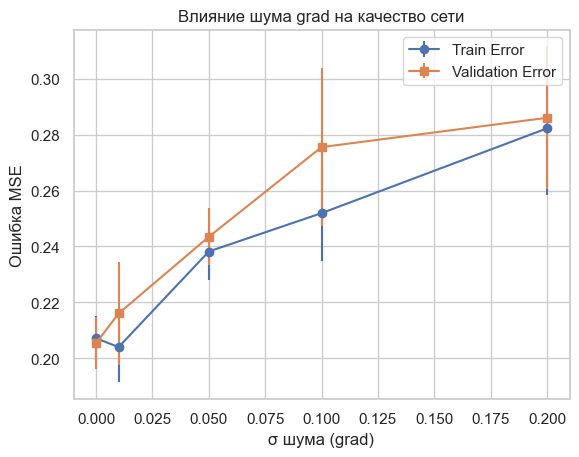

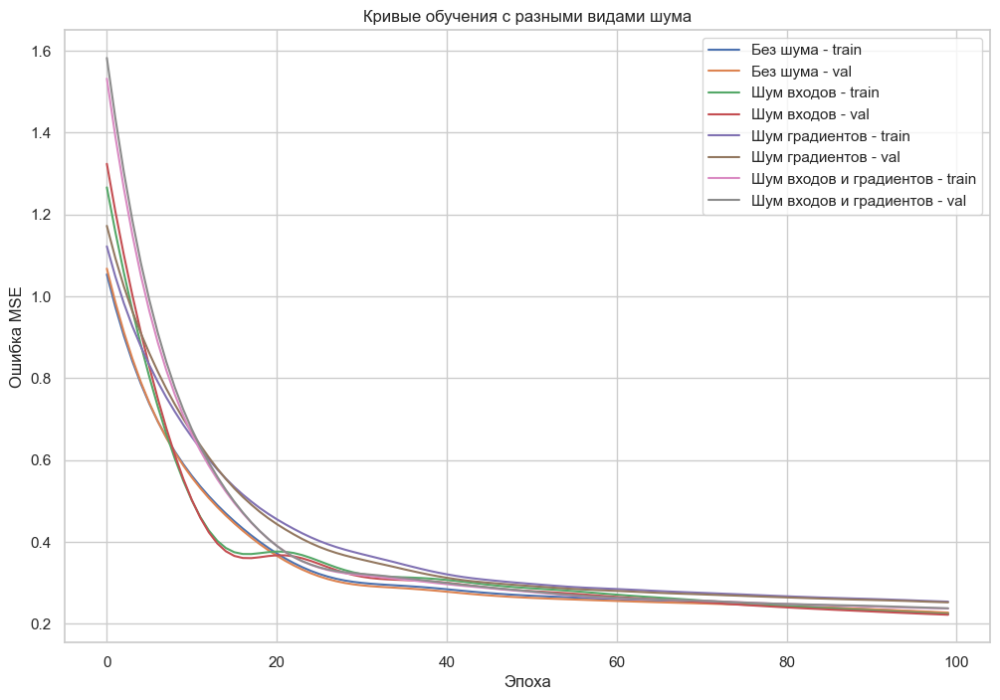

In [134]:
# Разделим изначальный тренировочный датасет на train и val
X_train_part, X_val_part, y_train_part, y_val_part = train_test_split(X_train_all, y_train_all, test_size=0.3, random_state=42)

# Пункт а) исследование для шума входов
noise_levels, train_means, train_stds, val_means, val_stds = study_noise_effect(
    X_train_all, y_train_all, input_dim=X.shape[1], hidden_size=10, noise_type='input', noise_levels=[0, 0.01, 0.05, 0.1, 0.2], epochs=100)

plot_noise_effect(noise_levels, train_means, train_stds, val_means, val_stds, noise_type='input')

# Пункт а) исследование для шума градиентов
noise_levels, train_means, train_stds, val_means, val_stds = study_noise_effect(
    X_train_all, y_train_all, input_dim=X.shape[1], hidden_size=10, noise_type='grad', noise_levels=[0, 0.01, 0.05, 0.1, 0.2], epochs=100)

plot_noise_effect(noise_levels, train_means, train_stds, val_means, val_stds, noise_type='grad')

# Пункт б) сравнение кривых обучения (используем, например, noise_std=0.05)
plot_training_curves_comparison(X_train_part, y_train_part, X_val_part, y_val_part, X.shape[1], 10, noise_std=0.05, epochs=100)


In [135]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


model.eval()
with torch.no_grad():
    y_train_pred = model(torch.tensor(X_train, dtype=torch.float32)).numpy().flatten()
    y_test_pred = model(torch.tensor(X_test, dtype=torch.float32)).numpy().flatten()

def plot_scatter_with_regression(y_true, y_pred, title):
    plt.figure(figsize=(6, 6))
    sns.scatterplot(x=y_true, y=y_pred, alpha=0.6)
    reg = LinearRegression().fit(y_true.reshape(-1, 1), y_pred)
    y_line = reg.predict(y_true.reshape(-1, 1))
    r2 = r2_score(y_true, y_pred)
    plt.plot(y_true, y_line, color='red', label=f'R² = {r2}')
    plt.xlabel("Желаемый выход")
    plt.ylabel("Выход модели")
    # plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

plot_scatter_with_regression(y_train.values, y_train_pred, "Train: Модель vs Истина")
plot_scatter_with_regression(y_test.values, y_test_pred, "Test: Модель vs Истина")

def plot_error_histogram(y_true, y_pred, title):
    errors = y_pred - y_true
    plt.figure(figsize=(6, 4))
    plt.hist(errors, bins=30, alpha=0.7, color='steelblue')
    plt.title(f'Гистограмма ошибок: {title}')
    plt.xlabel("Ошибка")
    plt.ylabel("Частота")
    plt.grid(True)
    plt.show()

plot_error_histogram(y_train.values, y_train_pred, "Обучающая выборка")
plot_error_histogram(y_test.values, y_test_pred, "Тестовая выборка")


ValueError: could not determine the shape of object type 'DataFrame'

In [137]:
# Предсказания модели
model.eval()
with torch.no_grad():
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
    
    y_train_pred = model(X_train_tensor).numpy().flatten()
    y_test_pred = model(X_test_tensor).numpy().flatten()

In [138]:
def plot_scatter_with_regression(y_true, y_pred, title):
    plt.figure(figsize=(6, 6))
    sns.scatterplot(x=y_true, y=y_pred, alpha=0.6)
    reg = LinearRegression().fit(y_true.reshape(-1, 1), y_pred)
    y_line = reg.predict(y_true.reshape(-1, 1))
    r2 = r2_score(y_true, y_pred)
    plt.plot(y_true, y_line, color='red', label=f'R² = {r2:.3f}')
    plt.xlabel("Желаемый выход")
    plt.ylabel("Выход модели")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

In [142]:
def plot_error_histogram(y_true, y_pred, title):
    errors = y_pred - y_true
    plt.figure(figsize=(6, 4))
    plt.hist(errors, bins=30, alpha=0.7, color='steelblue')
    plt.title(f'Гистограмма ошибок: {title}')
    plt.xlabel("Ошибка")
    plt.ylabel("Частота")
    plt.grid(True)
    plt.show()

In [140]:
y_train_array = y_train.to_numpy() if hasattr(y_train, "to_numpy") else y_train
y_test_array = y_test.to_numpy() if hasattr(y_test, "to_numpy") else y_test

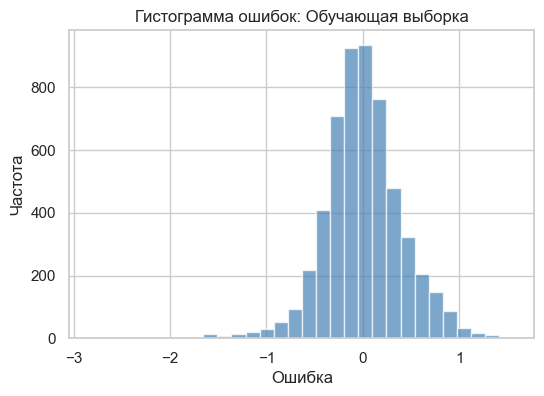

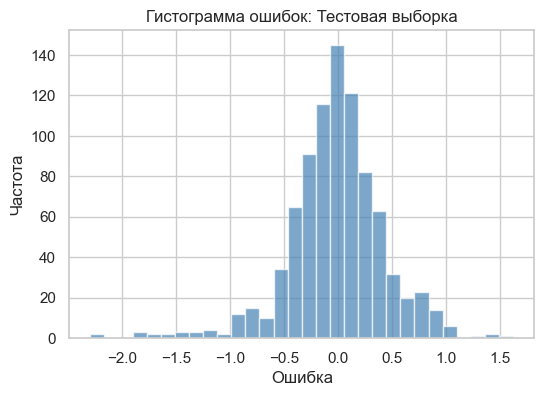

In [149]:
# Построение графиков
plot_error_histogram(y_train_array, y_train_pred, "Обучающая выборка")
plot_error_histogram(y_test_array, y_test_pred, "Тестовая выборка")

In [176]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Масштабирование
X_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train_scaled = X_scaler.fit_transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

y_train_scaled = y_scaler.fit_transform(y_train.values.reshape(-1, 1))
y_test_scaled = y_scaler.transform(y_test.values.reshape(-1, 1))


In [177]:
class Net(nn.Module):
    def __init__(self, input_dim, hidden_dim, activation_fn):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            activation_fn,
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):
        return self.net(x)

input_dim = X_train_scaled.shape[1]
hidden_size = 10
model = Net(input_dim, hidden_size, nn.ReLU())

optimizer = torch.optim.Adam(model.parameters(), lr=0.2)
criterion = nn.MSELoss()

X_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_tensor = torch.tensor(y_train_scaled, dtype=torch.float32)

# Тренировка
for epoch in range(500):
    model.train()
    optimizer.zero_grad()
    output = model(X_tensor)
    loss = criterion(output, y_tensor)
    loss.backward()
    optimizer.step()


In [178]:
model.eval()
with torch.no_grad():
    X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
    X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)

    y_train_pred_scaled = model(X_train_tensor).numpy()
    y_test_pred_scaled = model(X_test_tensor).numpy()

    y_train_pred = y_scaler.inverse_transform(y_train_pred_scaled).flatten()
    y_test_pred = y_scaler.inverse_transform(y_test_pred_scaled).flatten()


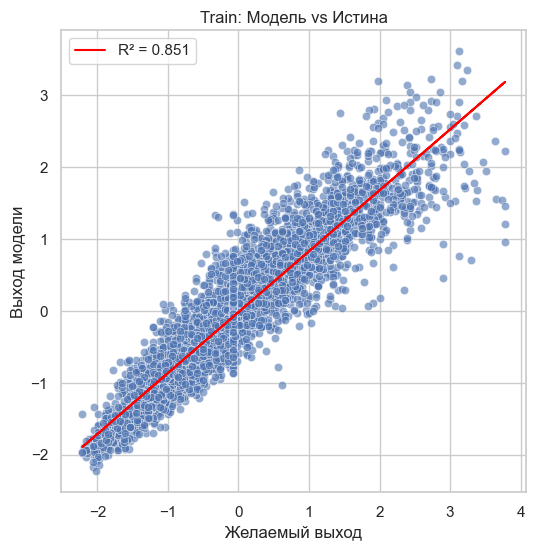

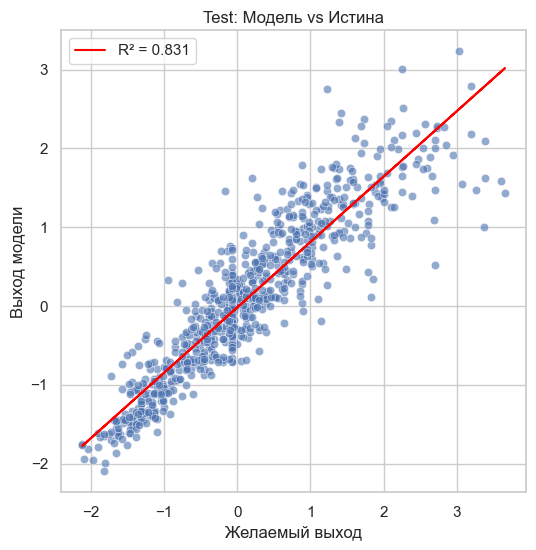

In [179]:
def plot_scatter_with_regression(y_true, y_pred, title):
    plt.figure(figsize=(6, 6))
    sns.scatterplot(x=y_true, y=y_pred, alpha=0.6)
    reg = LinearRegression().fit(y_true.reshape(-1, 1), y_pred)
    y_line = reg.predict(y_true.reshape(-1, 1))
    r2 = r2_score(y_true, y_pred)
    plt.plot(y_true, y_line, color='red', label=f'R² = {r2:.3f}')
    plt.xlabel("Желаемый выход")
    plt.ylabel("Выход модели")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

plot_scatter_with_regression(y_train.values, y_train_pred, "Train: Модель vs Истина")
plot_scatter_with_regression(y_test.values, y_test_pred, "Test: Модель vs Истина")


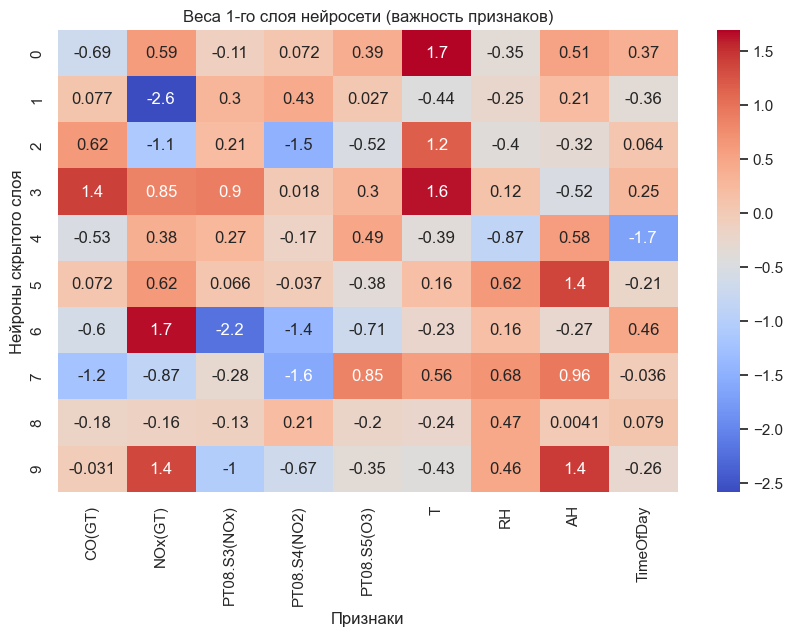

In [180]:
first_layer_weights = model.net[0].weight.detach().numpy()

plt.figure(figsize=(10, 6))
sns.heatmap(first_layer_weights, cmap='coolwarm', annot=True, xticklabels=X.columns)
plt.title("Веса 1-го слоя нейросети (важность признаков)")
plt.xlabel("Признаки")
plt.ylabel("Нейроны скрытого слоя")
plt.show()
